**PART 5 - DSIM project**

Francesca De Cola, Valentina Moretto, Valentina Zangirolami

In this notebook, we focus on convolutional neural network.

**Load packages**

In [ ]:
#!pip install git+https://github.com/rcmalli/keras-vggface.git
#!pip install keras_applications

import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import pandas as pd

import seaborn as sns
from matplotlib import style
style.use('seaborn-pastel')

import keras
from keras.layers import Dense, Dropout, Flatten, Activation, Conv2D, MaxPooling2D, BatchNormalization, PReLU
from keras.models import Model, Sequential, load_model
from keras.utils import to_categorical
from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
import keras_vggface
from keras_vggface.vggface import VGGFace
from keras_vggface.utils import preprocess_input, decode_predictions
from keras import regularizers
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
import tensorflow as tf

import os
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,StratifiedKFold

import random
import pickle

Using TensorFlow backend.
C:\Users\valen\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\valen\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\valen\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\valen\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py

In [ ]:
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

**Seed for reproducibility**

In [ ]:
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
tf.compat.v1.set_random_seed(SEED)

**Plot function**

We define a function $\textit{graph}$ for plotting the perfomance evalution of loss and accuracy value both on training and validation set.

In [ ]:
def graph(history):
    epochs=len(history.history['loss'])
    x_plot = list(range(1,epochs+1))
    plt.figure()
  
    plt.subplot(1, 2, 1)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.plot(x_plot, history.history['loss'])
    plt.plot(x_plot, history.history['val_loss'])
    plt.legend(['Training', 'Validation'])

  
    plt.subplot(1, 2, 2)
    plt.xlabel('Epochs')
    plt.ylabel('Acc')
    plt.plot(x_plot, history.history['acc'])
    plt.plot(x_plot, history.history['val_acc'])
    plt.legend(['Training', 'Validation'])
  
    plt.tight_layout()
    plt.show()

**Load dataset of images**

(We create this npz file in 1_creation_dataset.ipynb)

In [ ]:
data=np.load("C:/Users/valen/Desktop/magistrale/DSIM/dataset_imgs.npz")
label=data['Y']
img=data['X']

In [1]:
#plt.figure(figsize=(25, 8))
#nimages = 10 
#for i in range(nimages):
    #ax = plt.subplot(2, nimages, i + 1)
    #ax.get_xaxis().set_visible(False)
    #ax.get_yaxis().set_visible(False)
    #l = random.randint(0, len(label))
    #plt.imshow(img[l][:,:,::-1])
    #plt.title(str(label[l])+' '+str(l))

In [ ]:
print(label.shape)
print(img.shape)

(2269,)
(2269, 224, 224, 3)


**Preprocessing**

We transform pixel of images in type float and we use a preprocessing function of VGGFace. 
After that, we use LabelEncoder to encode target value of label with value $[0,6]$.

In [ ]:
img = np.array(img).astype('float64')
label = np.array(label)

In [ ]:
le = LabelEncoder()
label = le.fit_transform(label)

Finally, we apply preprocess function of VGGFace (resnet-50)

In [ ]:
img = preprocess_input(img,version=2)

 **FEATURE EXTRACTION**

In this section, we focus our attention of feature extraction. We use VGGFace to extract feature of images, this is useful for improve performance and in an other side to reduction dimensionality.

In [ ]:
base_model = VGGFace(include_top = False, input_shape = (224, 224, 3), model='senet50')

In [ ]:
base_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1/7x7_s2 (Conv2D)           (None, 112, 112, 64) 9408        input_1[0][0]                    
__________________________________________________________________________________________________
conv1/7x7_s2/bn (BatchNormaliza (None, 112, 112, 64) 256         conv1/7x7_s2[0][0]               
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 112, 112, 64) 0           conv1/7x7_s2/bn[0][0]            
__________________________________________________________________________________________________
max_poolin

We cut VGGFace NN in the final layers ('activation_66'). The new dimension of array of images is (14,14,1024).


In [ ]:
layer_cut = "activation_66" 
model = Model(inputs=base_model.input, outputs=base_model.get_layer(layer_cut).output)

In [ ]:
img = model.predict(img) # feature extraction

**CNN**

For evaluate the performance of alghoritms, we define 5-folds cross validation:

In [ ]:
seed = 42
np.random.seed(seed)
# define 5-fold cross validation 
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
cvscores = []

We define three types of callbacks:
* ModelCheckpoint, that allows to save the best weights in correspondence to minimum value of validation loss
* EarlyStopping, that allows to avoid overfitting and to achieve convergence of alghoritm. It used to stop the train phase when validation loss increas for 6 epochs
* ReduceLROnPlateau, it is used to scalar the value of learning rate (in this case: $new\_lr=0.5*lr$) when validation loss increases for 3 epochs

In [ ]:
filepath = "C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1,restore_best_weights=True) 
reduce_lr= ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=1e-5)

Convolutional neural network are more important to extract feature, vggface is useful to extract feature to treat facial images but our goal is recognize the expression of human face. For this reason, vggface help us to extract general feature of images but we costruct cnn to extract specific features. CNN are suitable for images and learn pattern with a spatial hierarchies of patterns, in which convolutional layer will learn small local patterns, a second convolution layer will learn larger patterns and so on.

CNN learn local pattern, unlike fully-connected neural network that learn global patterns, with a convolution operation. This operation is applied on a portion of images selected by a filter (or kernel) that slide on all image. After this process, convolution create a feature map with the sum of all convolution operation applied to all filter.

We test an initial structure of CNN with 3 convolutional layer (with 32 filter and a specific kernel size that define the heigh and width of filter) and fully-connected layer on final part.

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 1s 953us/step - loss: 1.6037 - acc: 0.3781 - val_loss: 0.8085 - val_acc: 0.7686

Epoch 00001: val_loss improved from inf to 0.80846, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.h5
Epoch 2/100
1452/1452 [==============================] - 1s 707us/step - loss: 0.7107 - acc: 0.7521 - val_loss: 0.6065 - val_acc: 0.7934

Epoch 00002: val_loss improved from 0.80846 to 0.60648, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.h5
Epoch 3/100
1452/1452 [==============================] - 1s 696us/step - loss: 0.4811 - acc: 0.8368 - val_loss: 0.3882 - val_acc: 0.8650

Epoch 00003: val_loss improved from 0.60648 to 0.38822, saving model to C:/Users/

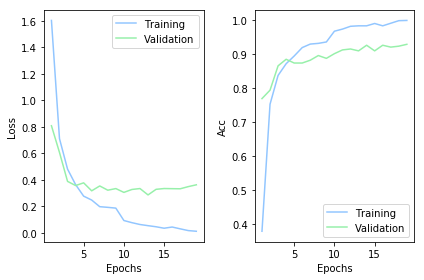

acc: 93.83%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 1s 962us/step - loss: 1.7408 - acc: 0.3216 - val_loss: 1.1076 - val_acc: 0.6832

Epoch 00001: val_loss did not improve from 0.28592
Epoch 2/100
1452/1452 [==============================] - 1s 668us/step - loss: 0.7824 - acc: 0.7266 - val_loss: 0.6152 - val_acc: 0.7658

Epoch 00002: val_loss did not improve from 0.28592
Epoch 3/100
1452/1452 [==============================] - 1s 694us/step - loss: 0.5297 - acc: 0.8292 - val_loss: 0.3813 - val_acc: 0.8595

Epoch 00003: val_loss did not improve from 0.28592
Epoch 4/100
1452/1452 [==============================] - 1s 681us/step - loss: 0.4255 - acc: 0.8506 - val_loss: 0.4002 - val_acc: 0.8623

Epoch 00004: val_loss did not improve from 0.28592
Epoch 5/100
1452/1452 [==============================] - 1s 705us/step - loss: 0.3311 - acc: 0.8898 - val_loss: 0.3134 - val_acc: 0.8815

Epoch 00005: val_loss did not improve from 0.28

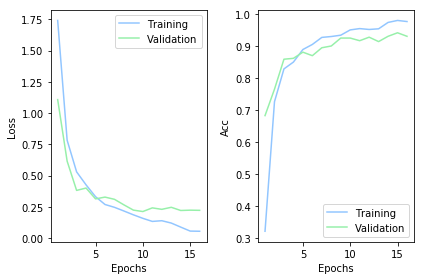

acc: 92.07%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.7714 - acc: 0.3127 - val_loss: 1.1976 - val_acc: 0.5179

Epoch 00001: val_loss did not improve from 0.21227
Epoch 2/100
1452/1452 [==============================] - 1s 704us/step - loss: 0.9078 - acc: 0.6639 - val_loss: 0.5808 - val_acc: 0.8182

Epoch 00002: val_loss did not improve from 0.21227
Epoch 3/100
1452/1452 [==============================] - 1s 712us/step - loss: 0.5804 - acc: 0.7996 - val_loss: 0.4575 - val_acc: 0.8457

Epoch 00003: val_loss did not improve from 0.21227
Epoch 4/100
1452/1452 [==============================] - 1s 696us/step - loss: 0.4216 - acc: 0.8616 - val_loss: 0.3593 - val_acc: 0.8788

Epoch 00004: val_loss did not improve from 0.21227
Epoch 5/100
1452/1452 [==============================] - 1s 715us/step - loss: 0.3466 - acc: 0.8898 - val_loss: 0.3344 - val_acc: 0.8815

Epoch 00005: val_loss did not improve from 0.2122

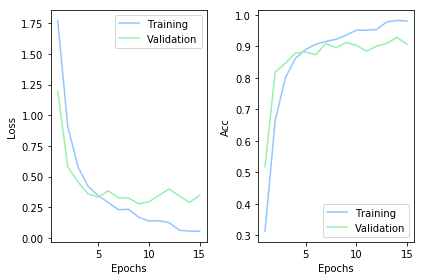

acc: 87.67%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.8368 - acc: 0.2769 - val_loss: 1.3878 - val_acc: 0.5234

Epoch 00001: val_loss did not improve from 0.21227
Epoch 2/100
1452/1452 [==============================] - 1s 694us/step - loss: 0.9895 - acc: 0.6577 - val_loss: 0.5453 - val_acc: 0.8320

Epoch 00002: val_loss did not improve from 0.21227
Epoch 3/100
1452/1452 [==============================] - 1s 746us/step - loss: 0.5719 - acc: 0.8017 - val_loss: 0.4363 - val_acc: 0.8402

Epoch 00003: val_loss did not improve from 0.21227
Epoch 4/100
1452/1452 [==============================] - 1s 713us/step - loss: 0.3966 - acc: 0.8547 - val_loss: 0.4199 - val_acc: 0.8512

Epoch 00004: val_loss did not improve from 0.21227
Epoch 5/100
1452/1452 [==============================] - 1s 692us/step - loss: 0.2993 - acc: 0.8988 - val_loss: 0.2907 - val_acc: 0.9118

Epoch 00005: val_loss did not improve from 0.2122

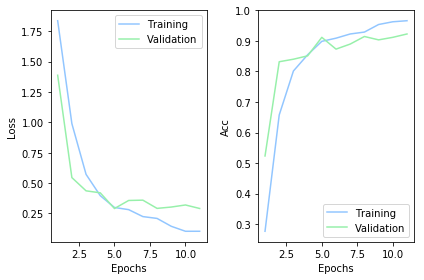

acc: 88.33%
Train on 1452 samples, validate on 364 samples
Epoch 1/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.6831 - acc: 0.3629 - val_loss: 0.9950 - val_acc: 0.6593

Epoch 00001: val_loss did not improve from 0.21227
Epoch 2/100
1452/1452 [==============================] - 1s 723us/step - loss: 0.7400 - acc: 0.7500 - val_loss: 0.4271 - val_acc: 0.8599

Epoch 00002: val_loss did not improve from 0.21227
Epoch 3/100
1452/1452 [==============================] - 1s 701us/step - loss: 0.4748 - acc: 0.8464 - val_loss: 0.3965 - val_acc: 0.8407

Epoch 00003: val_loss did not improve from 0.21227
Epoch 4/100
1452/1452 [==============================] - 1s 697us/step - loss: 0.4107 - acc: 0.8712 - val_loss: 0.3491 - val_acc: 0.8819

Epoch 00004: val_loss did not improve from 0.21227
Epoch 5/100
1452/1452 [==============================] - 1s 705us/step - loss: 0.3014 - acc: 0.9043 - val_loss: 0.2915 - val_acc: 0.8901

Epoch 00005: val_loss did not improve from 0.2122

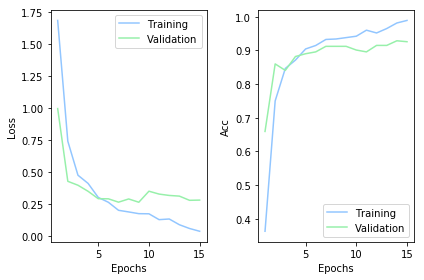

acc: 90.07%
90.39% (+/- 2.30%)


In [ ]:
for train, test in kfold.split(img, label):
  #create data
    x_train = img[train]
    x_test = img[test]
    y_train = to_categorical(label[train], num_classes = 7)
    y_test = to_categorical(label[test], num_classes = 7)

# Create model
    model = Sequential()
    # C1
    model.add(Conv2D(32, kernel_size=1, activation='relu', input_shape= (14, 14, 1024)))
    model.add(Conv2D(32, kernel_size=3, activation='relu'))
    model.add(Conv2D(32, kernel_size=1, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    # D
    model.add(Dense(128, activation='relu')) 
    model.add(Dropout(0.5)) 
    model.add(Dense(7, activation='softmax'))
# Compile model
    model.compile(loss=keras.losses.categorical_crossentropy,
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])
# Fit the model
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = .2, random_state = 42, stratify = y_train)

    model_log = model.fit(x_train, y_train,
          batch_size=16,
          epochs=100,
          verbose=1,
          validation_data=(x_val, y_val),
          callbacks=[early_stopping, checkpoint, reduce_lr])
    graph(model_log)
# Evaluate the model
    scores = model.evaluate(x_test, y_test, verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

The final value of accuracy (mean) of 5-fold cv is 90.39% with a variance +/- 2.30%.

For improve performance, we try to increase complexity of CNN with an high value for the last two convolutional layers and adding a layer dense before the output layer.

Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.8529 - acc: 0.2245 - val_loss: 1.2571 - val_acc: 0.4876

Epoch 00001: val_loss did not improve from 0.21227
Epoch 2/100
1452/1452 [==============================] - 1s 851us/step - loss: 1.0824 - acc: 0.5723 - val_loss: 0.7074 - val_acc: 0.7934

Epoch 00002: val_loss did not improve from 0.21227
Epoch 3/100
1452/1452 [==============================] - 1s 880us/step - loss: 0.7129 - acc: 0.7417 - val_loss: 0.5260 - val_acc: 0.8182

Epoch 00003: val_loss did not improve from 0.21227
Epoch 4/100
1452/1452 [==============================] - 1s 845us/step - loss: 0.5195 - acc: 0.8168 - val_loss: 0.4100 - val_acc: 0.8705

Epoch 00004: val_loss did not improve from 0.21227
Epoch 5/100
1452/1452 [==============================] - 1s 861us/step - loss: 0.4540 - acc: 0.8388 - val_loss: 0.3651 - val_acc: 0.8705

Epoch 00005: val_loss did not improve from 0.21227
Epoch 6/10

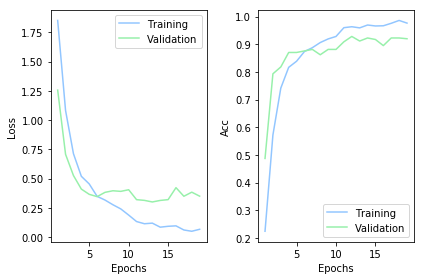

acc: 91.85%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.8220 - acc: 0.2638 - val_loss: 1.2338 - val_acc: 0.6198

Epoch 00001: val_loss did not improve from 0.21227
Epoch 2/100
1452/1452 [==============================] - 1s 859us/step - loss: 1.0650 - acc: 0.6061 - val_loss: 0.5799 - val_acc: 0.8099

Epoch 00002: val_loss did not improve from 0.21227
Epoch 3/100
1452/1452 [==============================] - 1s 873us/step - loss: 0.6449 - acc: 0.7748 - val_loss: 0.4356 - val_acc: 0.8457

Epoch 00003: val_loss did not improve from 0.21227
Epoch 4/100
1452/1452 [==============================] - 1s 853us/step - loss: 0.5011 - acc: 0.8409 - val_loss: 0.4109 - val_acc: 0.8595

Epoch 00004: val_loss did not improve from 0.21227
Epoch 5/100
1452/1452 [==============================] - 1s 902us/step - loss: 0.3802 - acc: 0.8760 - val_loss: 0.4372 - val_acc: 0.8402

Epoch 00005: val_loss did not improve from 0.2122

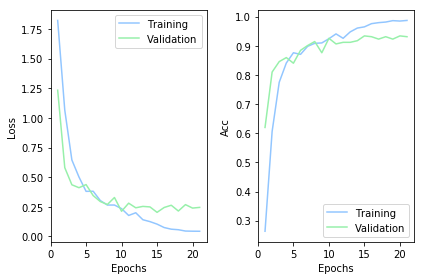

acc: 90.97%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.8948 - acc: 0.2183 - val_loss: 1.4469 - val_acc: 0.5234

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 1s 869us/step - loss: 1.2000 - acc: 0.5427 - val_loss: 0.7182 - val_acc: 0.7410

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 1s 851us/step - loss: 0.7694 - acc: 0.7225 - val_loss: 0.4584 - val_acc: 0.8567

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 1s 859us/step - loss: 0.6135 - acc: 0.7741 - val_loss: 0.4243 - val_acc: 0.8650

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 1s 911us/step - loss: 0.4665 - acc: 0.8368 - val_loss: 0.3231 - val_acc: 0.8898

Epoch 00005: val_loss did not improve from 0.2029

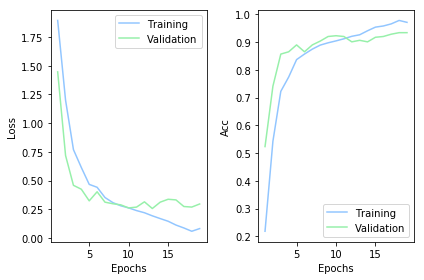

acc: 90.31%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.7826 - acc: 0.2700 - val_loss: 1.3717 - val_acc: 0.4683

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 1s 904us/step - loss: 0.9726 - acc: 0.6322 - val_loss: 0.6471 - val_acc: 0.7466

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 1s 882us/step - loss: 0.5676 - acc: 0.7920 - val_loss: 0.4806 - val_acc: 0.8485

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 1s 918us/step - loss: 0.4159 - acc: 0.8595 - val_loss: 0.4680 - val_acc: 0.8347

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 1s 899us/step - loss: 0.3214 - acc: 0.8946 - val_loss: 0.4106 - val_acc: 0.8430

Epoch 00005: val_loss did not improve from 0.2029

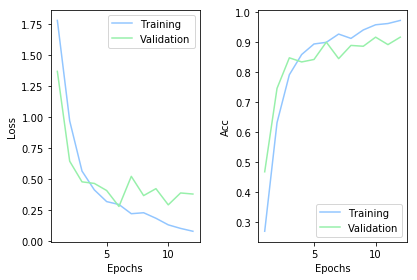

acc: 89.21%
Train on 1452 samples, validate on 364 samples
Epoch 1/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.7899 - acc: 0.2762 - val_loss: 1.4059 - val_acc: 0.5137

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 1s 885us/step - loss: 1.0799 - acc: 0.5985 - val_loss: 0.7574 - val_acc: 0.7308

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 1s 871us/step - loss: 0.6859 - acc: 0.7693 - val_loss: 0.4688 - val_acc: 0.8269

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 1s 918us/step - loss: 0.5031 - acc: 0.8258 - val_loss: 0.4406 - val_acc: 0.8407

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 1s 893us/step - loss: 0.4295 - acc: 0.8567 - val_loss: 0.3420 - val_acc: 0.8791

Epoch 00005: val_loss did not improve from 0.2029

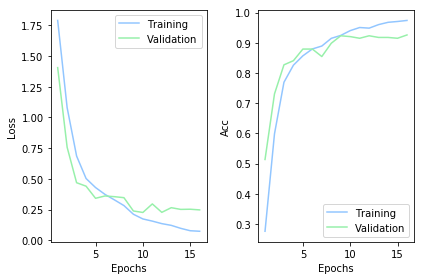

acc: 92.49%
90.97% (+/- 1.15%)


In [ ]:
filepath = "C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn2.h5"
cvscores = []
for train, test in kfold.split(img, label):
  #create data
    x_train = img[train]
    x_test = img[test]
    y_train = to_categorical(label[train], num_classes = 7)
    y_test = to_categorical(label[test], num_classes = 7)

# Create model
    model = Sequential()
    # C1
    model.add(Conv2D(32, kernel_size=1, activation='relu', input_shape= (14, 14, 1024)))
    model.add(Conv2D(64, kernel_size=3, activation='relu'))
    model.add(Conv2D(64, kernel_size=1, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    # D
    model.add(Dense(128, activation='relu')) 
    model.add(Dropout(0.5)) 
    model.add(Dense(64, activation='relu')) 
    model.add(Dense(7, activation='softmax'))
# Compile model
    model.compile(loss=keras.losses.categorical_crossentropy,
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])
# Fit the model
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = .2, random_state = 42, stratify = y_train)

    model_log = model.fit(x_train, y_train,
          batch_size=16,
          epochs=100,
          verbose=1,
          validation_data=(x_val, y_val),
          callbacks=[early_stopping, checkpoint, reduce_lr])
    graph(model_log)
# Evaluate the model
    scores = model.evaluate(x_test, y_test, verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

Value of accuracy is similar to the previous case, but variance is decreased. We try also to increase the complexity of the CNN with the addition of a convolutional layer after the first layer and increasing the number of nodes of the last layer dense.

However, an increase in complexity it can lead to a decrease in bias but an increase in variance. For this reason, we add L2 weight regularization at the final layers dense to oppose this effect. 

Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 2ms/step - loss: 3.5523 - acc: 0.2486 - val_loss: 2.0058 - val_acc: 0.5647

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 1s 997us/step - loss: 1.7180 - acc: 0.6033 - val_loss: 1.1771 - val_acc: 0.7769

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.1460 - acc: 0.7672 - val_loss: 1.0173 - val_acc: 0.8044

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 1s 996us/step - loss: 0.8734 - acc: 0.8561 - val_loss: 0.8216 - val_acc: 0.8512

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 1s 986us/step - loss: 0.7213 - acc: 0.8753 - val_loss: 0.8889 - val_acc: 0.8402

Epoch 00005: val_loss did not improve from 0.20297
Epoch 6/100


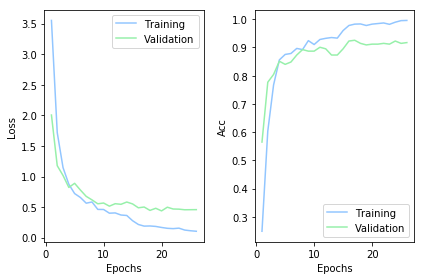

acc: 93.39%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 2ms/step - loss: 3.4422 - acc: 0.2893 - val_loss: 2.1895 - val_acc: 0.4050

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.6387 - acc: 0.6067 - val_loss: 1.1541 - val_acc: 0.7658

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.1364 - acc: 0.7658 - val_loss: 0.8612 - val_acc: 0.8430

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 2s 1ms/step - loss: 0.8848 - acc: 0.8216 - val_loss: 0.7539 - val_acc: 0.8540

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 2s 1ms/step - loss: 0.7467 - acc: 0.8457 - val_loss: 0.6883 - val_acc: 0.8733

Epoch 00005: val_loss did not improve from 0.20297
Epoch 

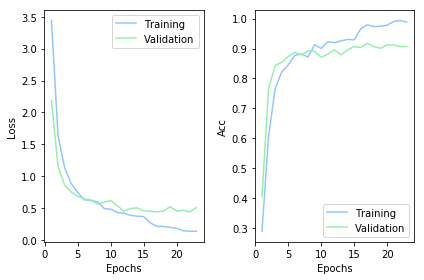

acc: 90.31%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 2ms/step - loss: 3.4364 - acc: 0.2596 - val_loss: 1.9267 - val_acc: 0.5344

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 2s 1ms/step - loss: 1.5403 - acc: 0.6357 - val_loss: 1.2314 - val_acc: 0.7769

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.0386 - acc: 0.7975 - val_loss: 0.8414 - val_acc: 0.8567

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 2s 1ms/step - loss: 0.8186 - acc: 0.8506 - val_loss: 0.7595 - val_acc: 0.8567

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 1s 1ms/step - loss: 0.7011 - acc: 0.8850 - val_loss: 0.6780 - val_acc: 0.8705

Epoch 00005: val_loss did not improve from 0.20297
Epoch 

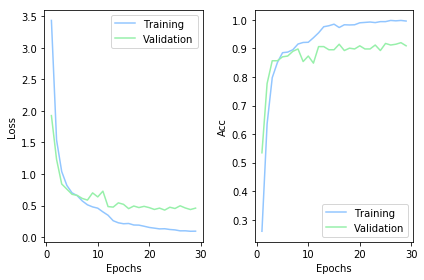

acc: 92.73%
Train on 1452 samples, validate on 363 samples
Epoch 1/100
1452/1452 [==============================] - 2s 2ms/step - loss: 3.4313 - acc: 0.2679 - val_loss: 1.9347 - val_acc: 0.5317

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.4513 - acc: 0.6736 - val_loss: 1.1363 - val_acc: 0.7548

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 2s 1ms/step - loss: 0.9940 - acc: 0.7975 - val_loss: 0.8202 - val_acc: 0.8430

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 1s 1ms/step - loss: 0.7676 - acc: 0.8602 - val_loss: 0.8530 - val_acc: 0.8099

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 1s 1ms/step - loss: 0.6978 - acc: 0.8719 - val_loss: 0.9207 - val_acc: 0.8072

Epoch 00005: val_loss did not improve from 0.20297
Epoch 

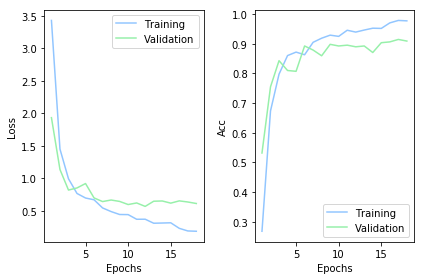

acc: 86.78%
Train on 1452 samples, validate on 364 samples
Epoch 1/100
1452/1452 [==============================] - 3s 2ms/step - loss: 3.5744 - acc: 0.2052 - val_loss: 2.2909 - val_acc: 0.4176

Epoch 00001: val_loss did not improve from 0.20297
Epoch 2/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.7317 - acc: 0.5331 - val_loss: 1.2450 - val_acc: 0.6813

Epoch 00002: val_loss did not improve from 0.20297
Epoch 3/100
1452/1452 [==============================] - 1s 1ms/step - loss: 1.0924 - acc: 0.7555 - val_loss: 0.8595 - val_acc: 0.8407

Epoch 00003: val_loss did not improve from 0.20297
Epoch 4/100
1452/1452 [==============================] - 1s 1ms/step - loss: 0.8541 - acc: 0.8258 - val_loss: 0.8152 - val_acc: 0.8297

Epoch 00004: val_loss did not improve from 0.20297
Epoch 5/100
1452/1452 [==============================] - 2s 1ms/step - loss: 0.7073 - acc: 0.8547 - val_loss: 0.6986 - val_acc: 0.8819

Epoch 00005: val_loss did not improve from 0.20297
Epoch 

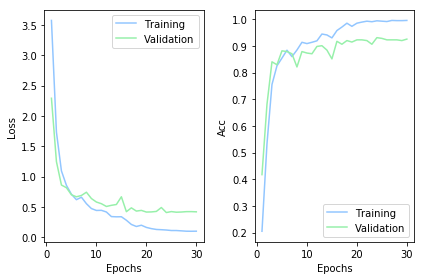

acc: 91.61%
90.97% (+/- 2.34%)


In [ ]:
filepath = "C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn2.h5"
cvscores = []
for train, test in kfold.split(img, label):
  #create data
    x_train = img[train]
    x_test = img[test]
    y_train = to_categorical(label[train], num_classes = 7)
    y_test = to_categorical(label[test], num_classes = 7)

# Create model
    model = Sequential()
    # C1
    model.add(Conv2D(32, kernel_size=1, activation='relu', input_shape= (14, 14, 1024)))
    model.add(Conv2D(32, kernel_size=3, activation='relu'))
    model.add(Conv2D(64, kernel_size=3, activation='relu'))
    model.add(Conv2D(64, kernel_size=1, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    # D
    model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01))) 
    model.add(Dropout(0.5)) 
    model.add(Dense(64, activation='relu',kernel_regularizer=regularizers.l2(0.01))) 
    model.add(Dense(7, activation='softmax'))
# Compile model
    model.compile(loss=keras.losses.categorical_crossentropy,
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])
# Fit the model
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = .2, random_state = 42, stratify = y_train)

    model_log = model.fit(x_train, y_train,
          batch_size=16,
          epochs=100,
          verbose=1,
          validation_data=(x_val, y_val),
          callbacks=[early_stopping, checkpoint, reduce_lr])
    graph(model_log)
# Evaluate the model
    scores = model.evaluate(x_test, y_test, verbose=0)
    print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    cvscores.append(scores[1] * 100)
print("%.2f%% (+/- %.2f%%)" % (np.mean(cvscores), np.std(cvscores)))

We choice the second structure of CNN because in this last structure the value of variance increase.

**Choice of the network cut**

In this section we focus on the choice of the cut of pretrained neural network. After selecting the optimal structure of CNN, we evaluate a potential new layer (between the last layers) of VGGFace to consider to cut for feature extraction.

We divide the initial dataset into training/validation/test set.

In [ ]:
label=data['Y']
img=data['X']

x_train, x_test, y_train, y_test = train_test_split(img, label, test_size = .2, random_state = SEED, stratify = label)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = .2, random_state = SEED, stratify = y_train)
print(x_train.shape, y_train.shape, x_val.shape, y_val.shape, x_test.shape, y_test.shape)

(1452, 224, 224, 3) (1452,) (363, 224, 224, 3) (363,) (454, 224, 224, 3) (454,)


**Visualization of the proportion of each class for each partition**

C:\Users\valen\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\valen\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\valen\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


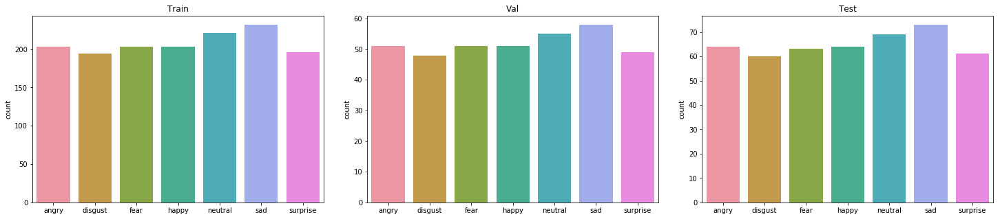

In [ ]:
order =  ['angry','disgust','fear','happy','neutral','sad','surprise']

fig = plt.figure(figsize = (25,5))
fig.subplots_adjust(hspace=0, wspace=0.15)
ax = fig.add_subplot(1, 3, 1)
ax.set_title('Train')
sns.countplot(y_train, order = order)
ax = fig.add_subplot(1, 3, 2)
ax.set_title('Val')
sns.countplot(y_val, order = order)
ax = fig.add_subplot(1, 3, 3)
ax.set_title('Test')
sns.countplot(y_test, order = order)
plt.show()

**Preprocessing**

Preprocessing phase regard:
* labels, with label encoder we trasform classes (happy. angry, ecc.) into an interval [0,6] and with to_categorical we create a matrix of 1 and 0, in which 1 is collocate at the column of true class.
* images, pixel are converted to the float value and we change the value of them with a specific function for preprocessing.

In [ ]:
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_train = to_categorical(y_train, num_classes = 7)
y_test = le.fit_transform(y_test)
y_eff=y_test
y_test = to_categorical(y_test, num_classes = 7)
y_val = le.fit_transform(y_val)
y_val = to_categorical(y_val, num_classes = 7)

In [ ]:
x_train = x_train.astype('float64')
x_test = x_test.astype('float64')
x_val = x_val.astype('float64')
x_train = preprocess_input(x_train, version=2)
x_test = preprocess_input(x_test, version=2)
x_val = preprocess_input(x_val, version=2)

We use second structure and define a range of possible layers to select. We exclude to test of cut selection the initial layers of vggface, because we think that cut at this point are not necessary because vggface is neural network trained to simil task. We focus our attention on final layers. However, we not select all layers comprises in this range, but we filter layer with two characteristich:

* 3-dimension 
* the first dimension (and second) must be greater than 1

Start in layer: conv3_4_1x1_reduce
Start 1/3

Epoch 00001: val_loss improved from inf to 1.42228, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00002: val_loss improved from 1.42228 to 0.61615, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00003: val_loss improved from 0.61615 to 0.40402, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00004: val_loss improved from 0.40402 to 0.34561, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00005: val_loss improved from 0.34561 to 0.31430, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00006: val_loss improved from 0.31430 to 0.24507, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00007: val_loss did not improve from 0.24507

Epoch 00008: val_loss improved from 0.24507 to 0.22700, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml

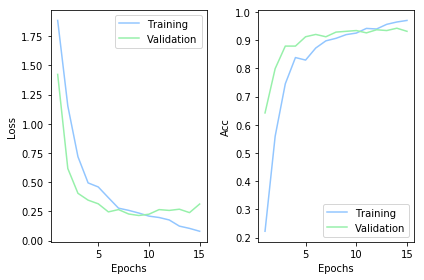

454/454 [==============================] - 0s 339us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3295
Start 2/3

Epoch 00001: val_loss did not improve from 0.21413

Epoch 00002: val_loss did not improve from 0.21413

Epoch 00003: val_loss did not improve from 0.21413

Epoch 00004: val_loss did not improve from 0.21413

Epoch 00005: val_loss did not improve from 0.21413

Epoch 00006: val_loss did not improve from 0.21413

Epoch 00007: val_loss did not improve from 0.21413

Epoch 00008: val_loss did not improve from 0.21413

Epoch 00009: val_loss did not improve from 0.21413

Epoch 00010: val_loss improved from 0.21413 to 0.20742, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00011: val_loss improved from 0.20742 to 0.20111, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00012: val_loss did not improve from 0.20111

Epoch 00013: val_loss did not improve from 0.20111

Epoch 00014: val_loss did not improv

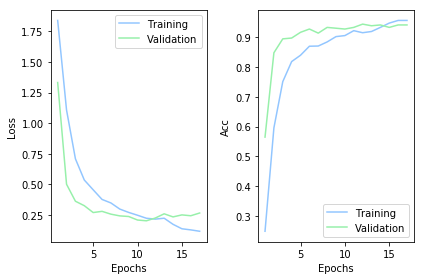

454/454 [==============================] - 0s 326us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.2785
Start 3/3

Epoch 00001: val_loss did not improve from 0.20111

Epoch 00002: val_loss did not improve from 0.20111

Epoch 00003: val_loss did not improve from 0.20111

Epoch 00004: val_loss did not improve from 0.20111

Epoch 00005: val_loss did not improve from 0.20111

Epoch 00006: val_loss did not improve from 0.20111

Epoch 00007: val_loss did not improve from 0.20111

Epoch 00008: val_loss did not improve from 0.20111

Epoch 00009: val_loss improved from 0.20111 to 0.19884, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00011: val_loss did not improve from 0.19884

Epoch 00012: val_loss did not improve from 0.19884

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.19884

Epoch 00014: val_loss did not impro

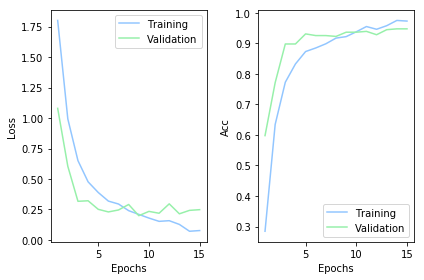

454/454 [==============================] - 0s 333us/step
Post-training accuracy: 91.41 %
Post-training loss: 0.2688
Start in layer: conv3_4_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss did not improve from 0.19884

Epoch 00008: val_loss did not improve from 0.19884

Epoch 00009: val_loss did not improve from 0.19884

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00011: val_loss did not improve from 0.19884

Epoch 00012: val_loss did not improve from 0.19884

Epoch 00013: val_loss did not improve from 0.19884

Epoch 00014: val_loss did not improve from 0.19884

Epoch 00015: val_loss did not improve from 0.19884

Epoch 00015: ReduceLROnPlateau reducing learning rate t

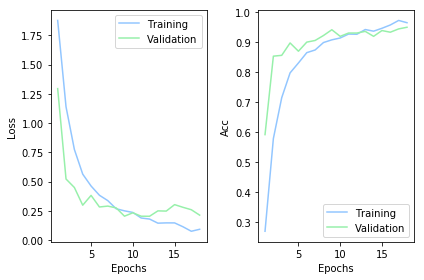

454/454 [==============================] - 0s 333us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3816
Start 2/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss did not improve from 0.19884

Epoch 00008: val_loss did not improve from 0.19884

Epoch 00009: val_loss did not improve from 0.19884

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00011: val_loss did not improve from 0.19884

Epoch 00012: val_loss did not improve from 0.19884

Epoch 00013: val_loss did not improve from 0.19884

Epoch 00014: val_loss did not improve from 0.19884

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.19884

Epoch 00016

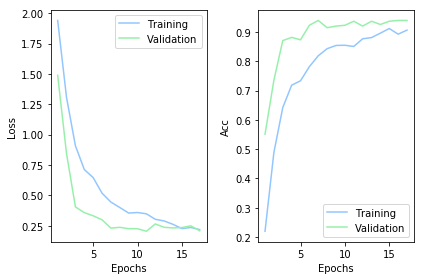

454/454 [==============================] - 0s 350us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.3117
Start 3/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss did not improve from 0.19884

Epoch 00008: val_loss did not improve from 0.19884

Epoch 00009: val_loss did not improve from 0.19884

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00011: val_loss did not improve from 0.19884

Epoch 00012: val_loss did not improve from 0.19884

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.19884

Epoch 00014: val_loss did not improve from 0.19884

Epoch 00015: val_loss did not improve from 0.19884

Epoch 00016

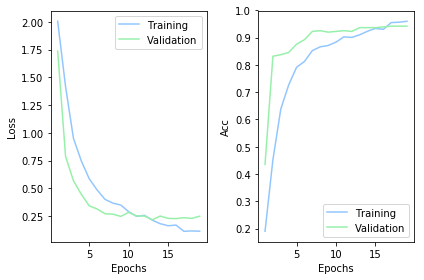

454/454 [==============================] - 0s 313us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.298
Start in layer: activation_32
Start 1/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss did not improve from 0.19884

Epoch 00008: val_loss did not improve from 0.19884

Epoch 00009: val_loss did not improve from 0.19884

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.19884

Epoch 00012: val_loss did not improve from 0.19884
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.19884

Epoch 00013: ReduceLROnPlateau 

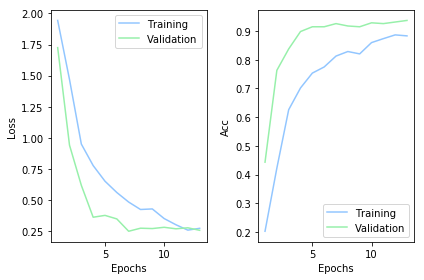

454/454 [==============================] - 0s 353us/step
Post-training accuracy: 87.004 %
Post-training loss: 0.3397
Start 2/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss did not improve from 0.19884

Epoch 00008: val_loss did not improve from 0.19884

Epoch 00009: val_loss did not improve from 0.19884

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00011: val_loss did not improve from 0.19884
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.19884

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


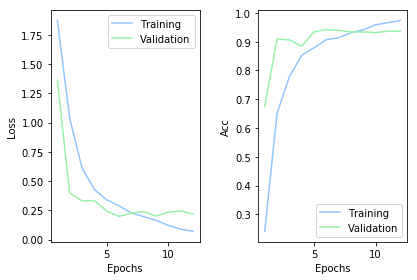

454/454 [==============================] - 0s 350us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.353
Start 3/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss did not improve from 0.19884

Epoch 00008: val_loss did not improve from 0.19884

Epoch 00009: val_loss did not improve from 0.19884

Epoch 00010: val_loss did not improve from 0.19884

Epoch 00011: val_loss did not improve from 0.19884

Epoch 00012: val_loss did not improve from 0.19884

Epoch 00013: val_loss did not improve from 0.19884

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.19884

Epoch 00015: val_loss did not improve from 0.19884
Restoring mod

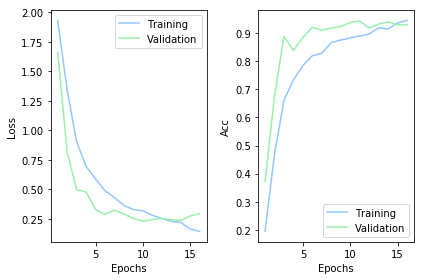

454/454 [==============================] - 0s 353us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3139
Start in layer: conv3_4_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.19884

Epoch 00002: val_loss did not improve from 0.19884

Epoch 00003: val_loss did not improve from 0.19884

Epoch 00004: val_loss did not improve from 0.19884

Epoch 00005: val_loss did not improve from 0.19884

Epoch 00006: val_loss did not improve from 0.19884

Epoch 00007: val_loss improved from 0.19884 to 0.19422, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00008: val_loss improved from 0.19422 to 0.19119, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00009: val_loss improved from 0.19119 to 0.17083, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5

Epoch 00010: val_loss did not improve from 0.17083

Epoch 00011: val_loss improved from 0.17083 to 0.16891, saving model to C:/Users/val

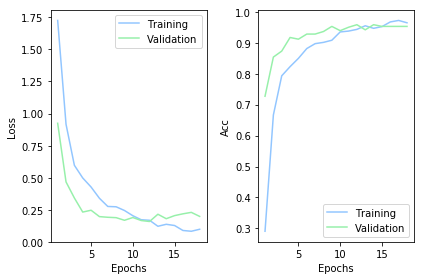

454/454 [==============================] - 0s 337us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3356
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


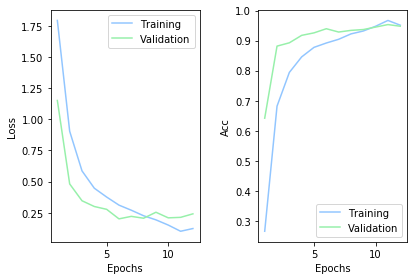

454/454 [==============================] - 0s 306us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3074
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

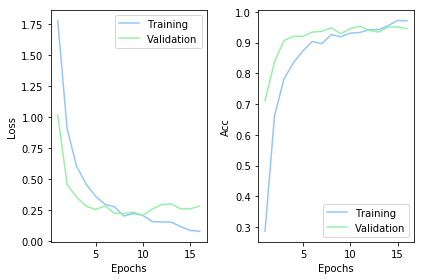

454/454 [==============================] - 0s 346us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.2682
Start in layer: conv3_4_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 000

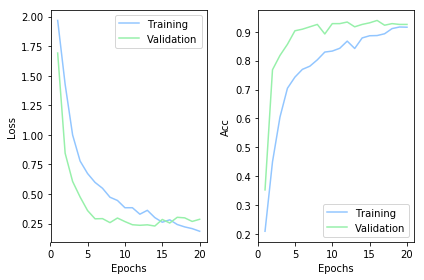

454/454 [==============================] - 0s 372us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3328
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

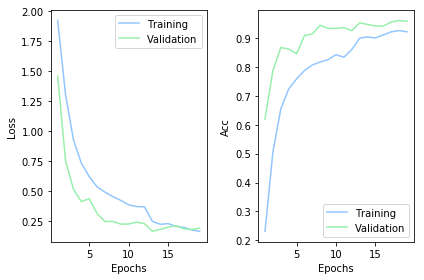

454/454 [==============================] - 0s 355us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3575
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

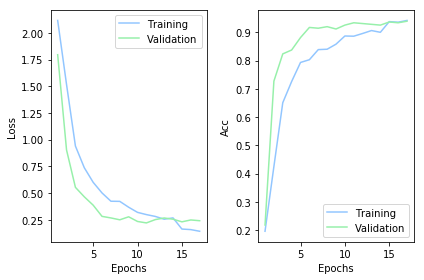

454/454 [==============================] - 0s 381us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3662
Start in layer: activation_33
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.000

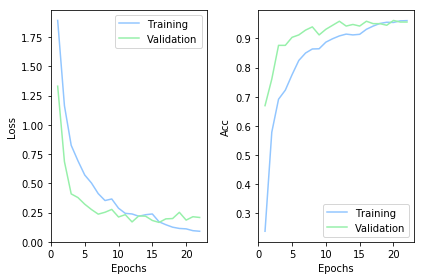

454/454 [==============================] - 0s 335us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.2796
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

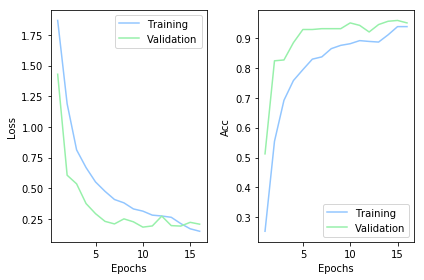

454/454 [==============================] - 0s 344us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.3165
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

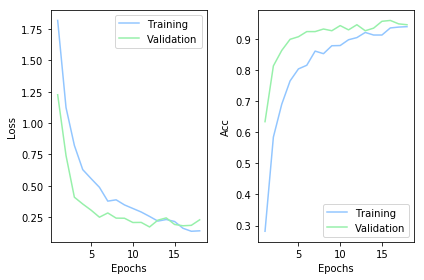

454/454 [==============================] - 0s 379us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.335
Start in layer: conv3_4_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to

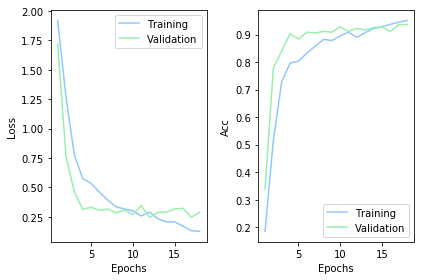

454/454 [==============================] - 0s 679us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3614
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

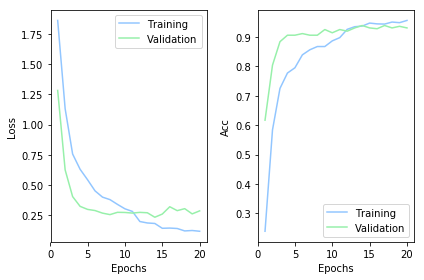

454/454 [==============================] - 0s 670us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3647
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

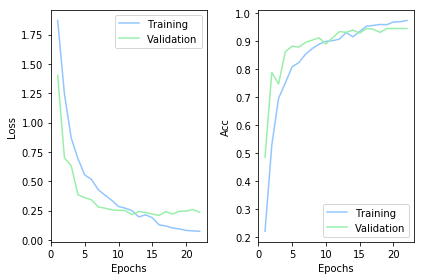

454/454 [==============================] - 0s 701us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.3628
Start in layer: conv3_4_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss d

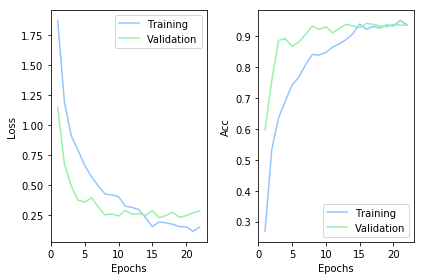

454/454 [==============================] - 0s 606us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.2788
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

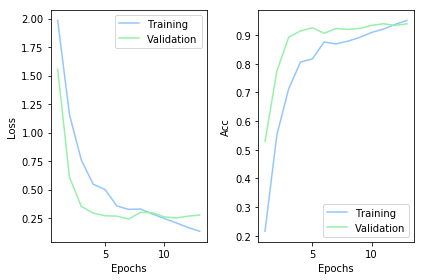

454/454 [==============================] - 0s 611us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.2975
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

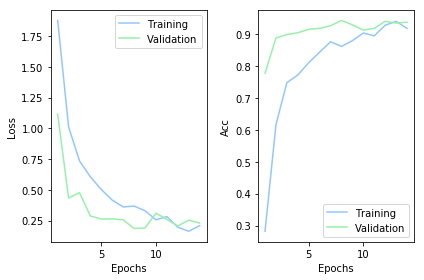

454/454 [==============================] - 0s 621us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.3595
Start in layer: multiply_7
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not imp

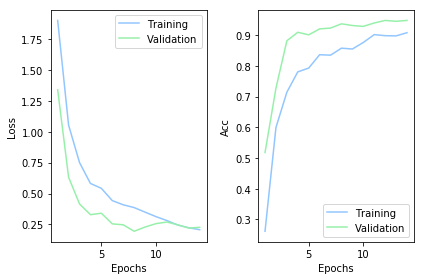

454/454 [==============================] - 0s 597us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3247
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

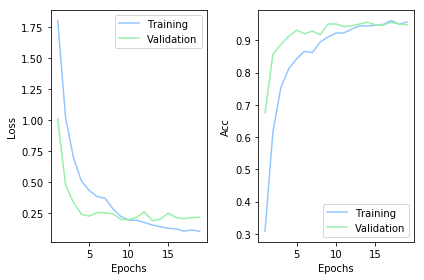

454/454 [==============================] - 0s 586us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3279
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

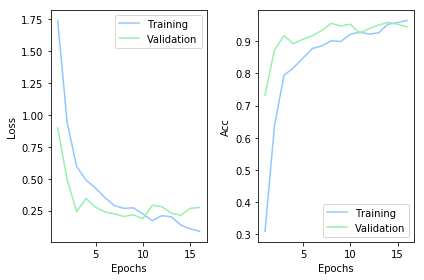

454/454 [==============================] - 0s 606us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.329
Start in layer: add_7
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: Reduce

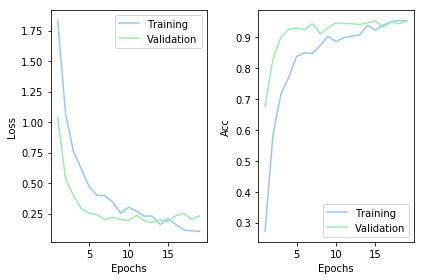

454/454 [==============================] - 0s 586us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.2813
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

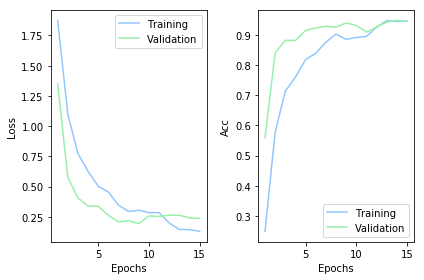

454/454 [==============================] - 0s 621us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3504
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

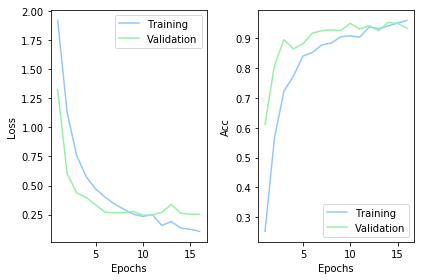

454/454 [==============================] - 0s 586us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3272
Start in layer: activation_36
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

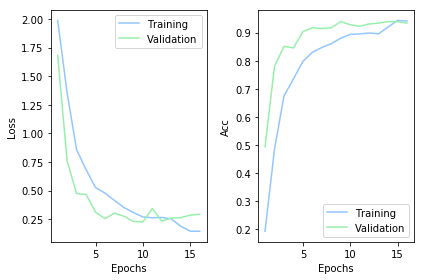

454/454 [==============================] - 0s 608us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.29
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve from

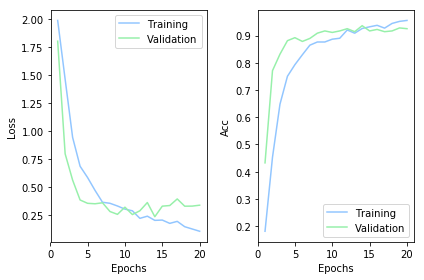

454/454 [==============================] - 0s 590us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3243
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

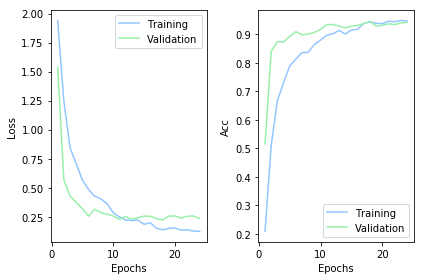

454/454 [==============================] - 0s 659us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3262
Start in layer: conv4_1_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did no

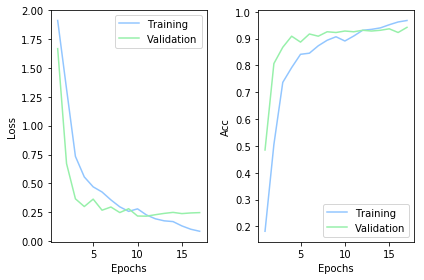

454/454 [==============================] - 0s 132us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3166
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

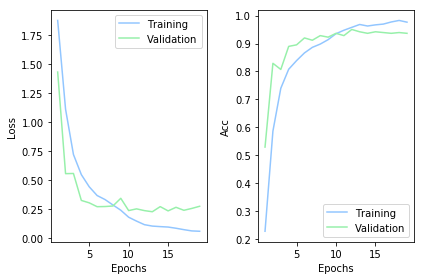

454/454 [==============================] - 0s 132us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3778
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

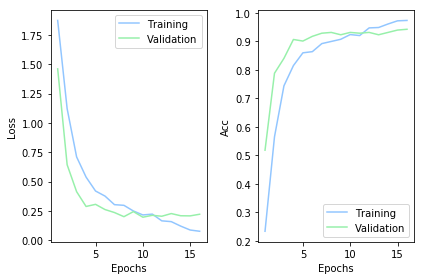

454/454 [==============================] - 0s 136us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3127
Start in layer: conv4_1_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.000250000011874362

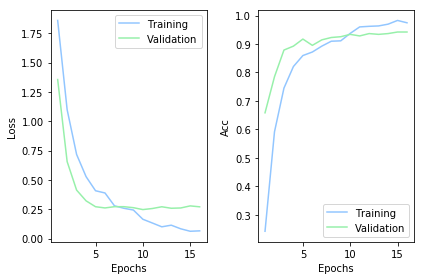

454/454 [==============================] - 0s 137us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3896
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

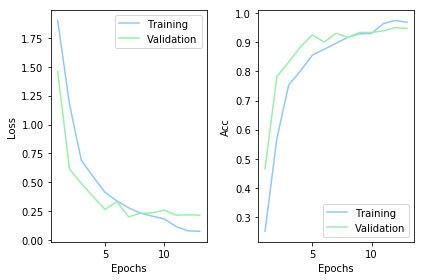

454/454 [==============================] - 0s 139us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3133
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

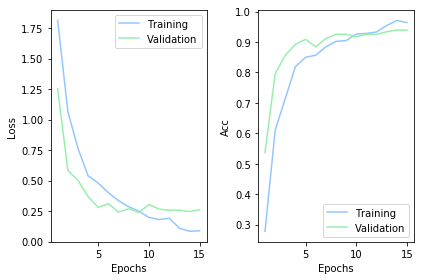

454/454 [==============================] - 0s 139us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3171
Start in layer: activation_37
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not 

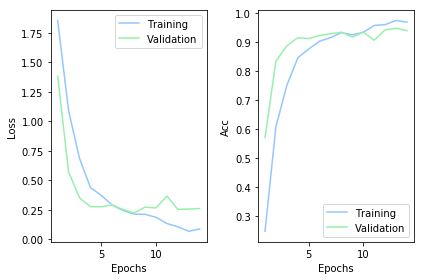

454/454 [==============================] - 0s 145us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3162
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


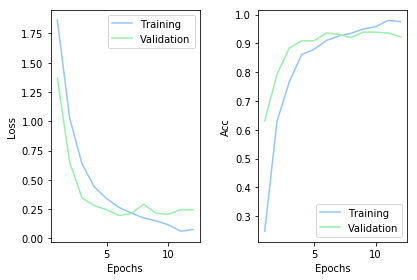

454/454 [==============================] - 0s 143us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3135
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

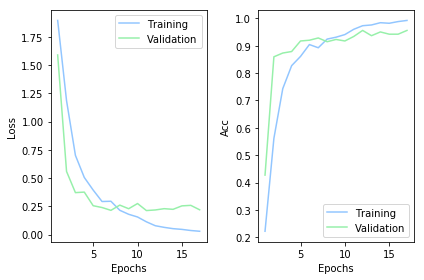

454/454 [==============================] - 0s 148us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.322
Start in layer: conv4_1_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end 

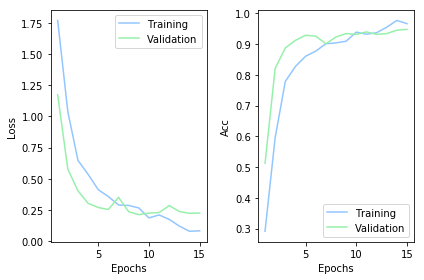

454/454 [==============================] - 0s 141us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3055
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

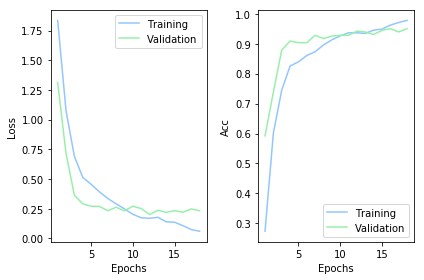

454/454 [==============================] - 0s 141us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3146
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

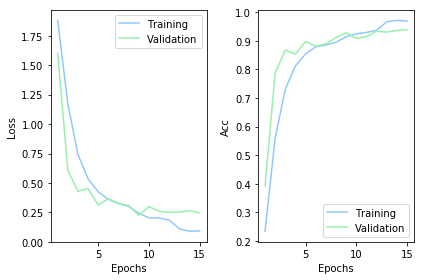

454/454 [==============================] - 0s 143us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3105
Start in layer: conv4_1_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not im

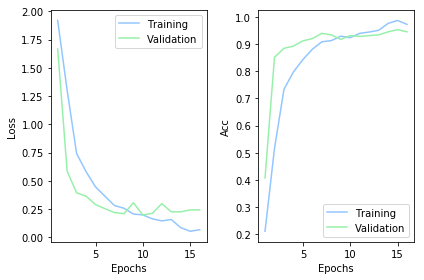

454/454 [==============================] - 0s 141us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3066
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

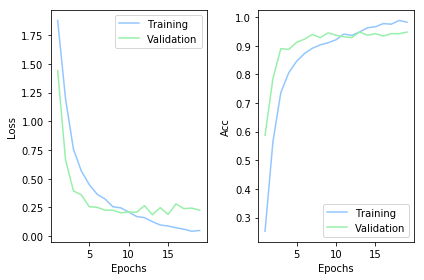

454/454 [==============================] - 0s 150us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.328
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: 

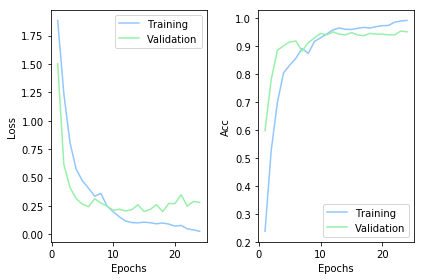

454/454 [==============================] - 0s 150us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3419
Start in layer: activation_38
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau red

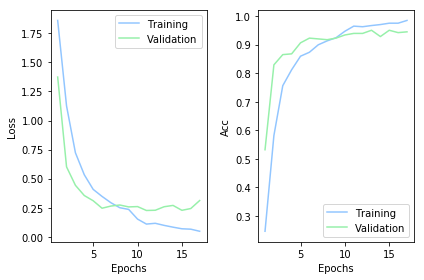

454/454 [==============================] - 0s 150us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.4215
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

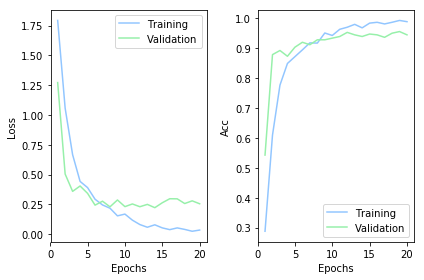

454/454 [==============================] - 0s 148us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3987
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

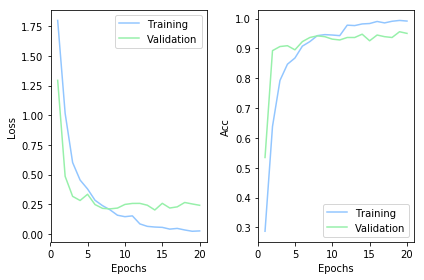

454/454 [==============================] - 0s 150us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3759
Start in layer: conv4_1_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did 

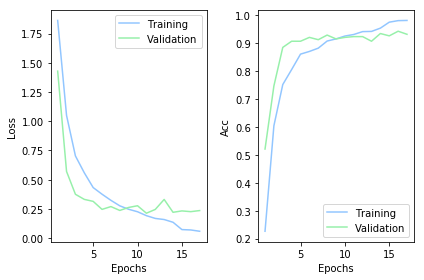

454/454 [==============================] - 0s 326us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3551
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

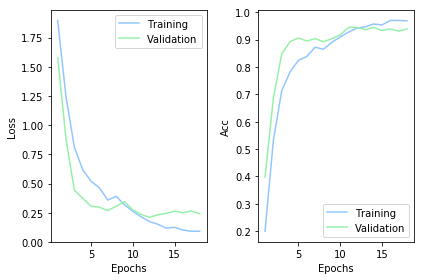

454/454 [==============================] - 0s 337us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3664
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

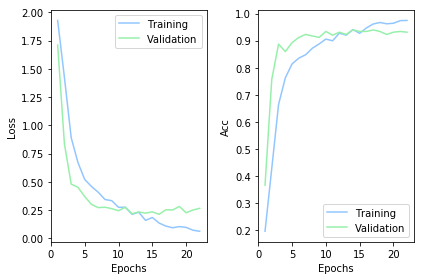

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.4171
Start in layer: conv4_1_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss d

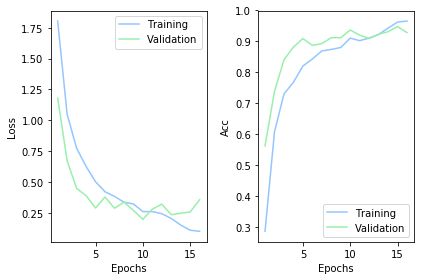

454/454 [==============================] - 0s 348us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3041
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

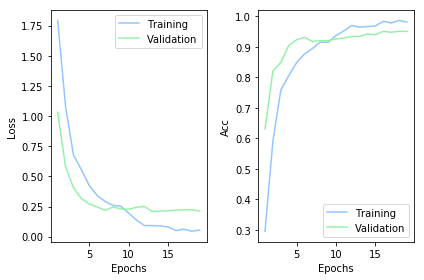

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3523
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

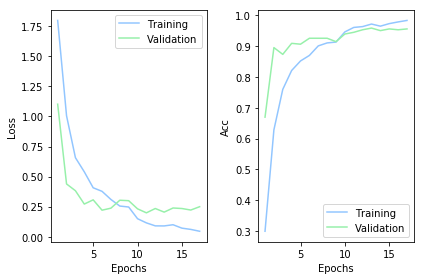

454/454 [==============================] - 0s 377us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3382
Start in layer: conv4_1_1x1_proj
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not i

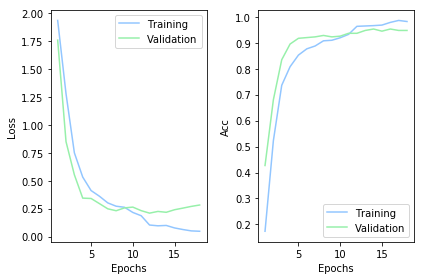

454/454 [==============================] - 0s 337us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.2928
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

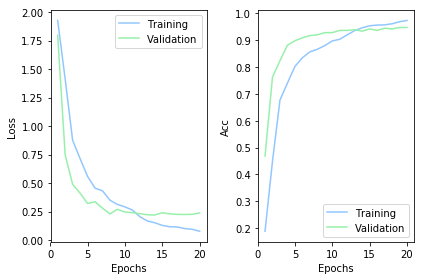

454/454 [==============================] - 0s 359us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3122
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

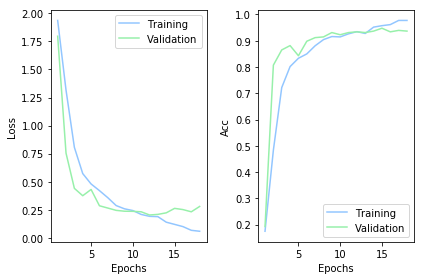

454/454 [==============================] - 0s 344us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3872
Start in layer: multiply_8
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not imp

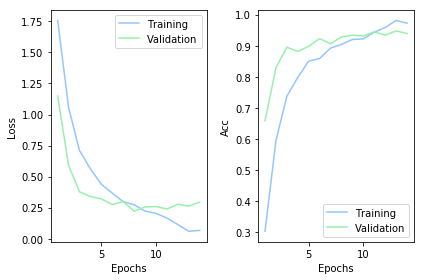

454/454 [==============================] - 0s 341us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.3576
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

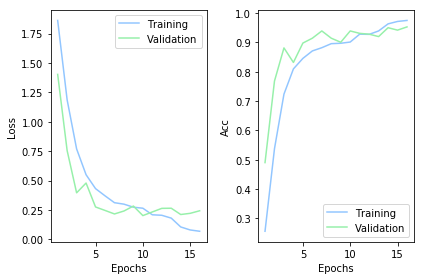

454/454 [==============================] - 0s 381us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3327
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

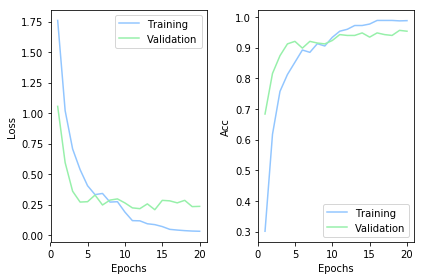

454/454 [==============================] - 0s 397us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3589
Start in layer: conv4_1_1x1_proj/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 

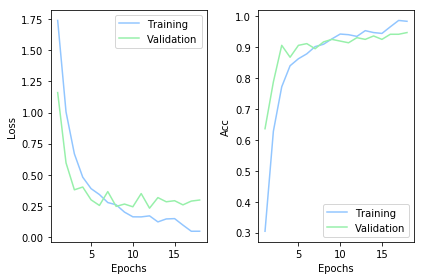

454/454 [==============================] - 0s 410us/step
Post-training accuracy: 91.189 %
Post-training loss: 0.2735
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


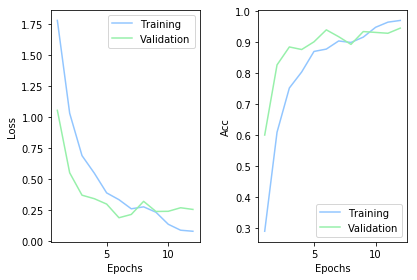

454/454 [==============================] - 0s 370us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3176
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

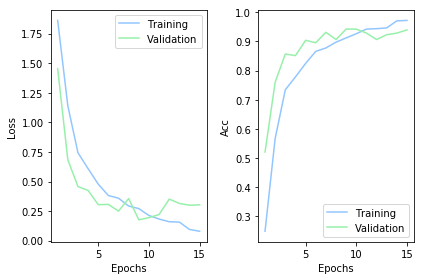

454/454 [==============================] - 0s 357us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3403
Start in layer: add_8
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve fro

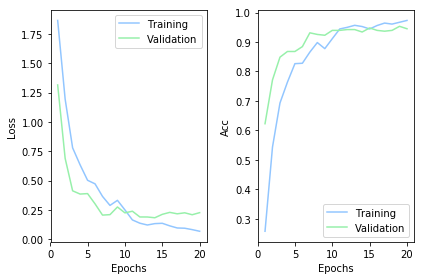

454/454 [==============================] - 0s 392us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.2933
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

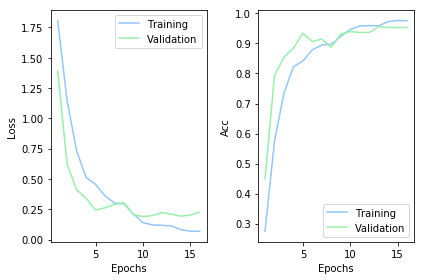

454/454 [==============================] - 0s 392us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3265
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016:

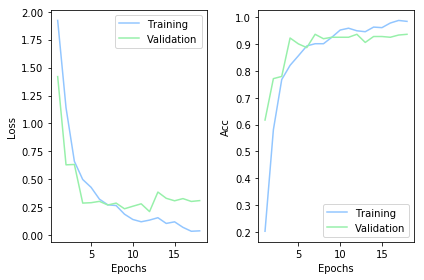

454/454 [==============================] - 0s 383us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3585
Start in layer: activation_41
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00013: val_loss did not improve from 0.16130

Epoc

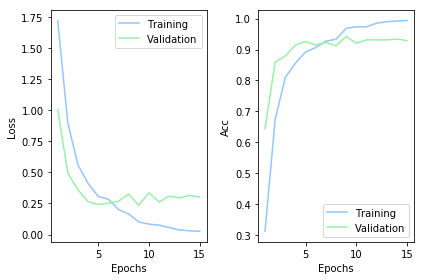

454/454 [==============================] - 0s 414us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3786
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

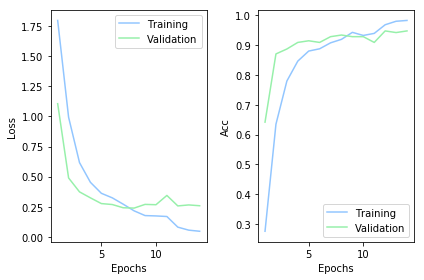

454/454 [==============================] - 0s 392us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3482
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00011: early stopping


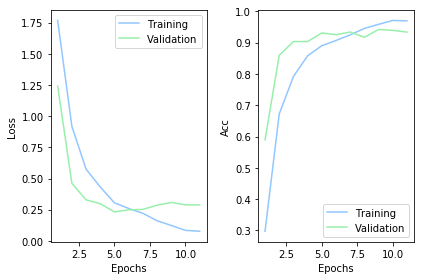

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3533
Start in layer: conv4_2_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch

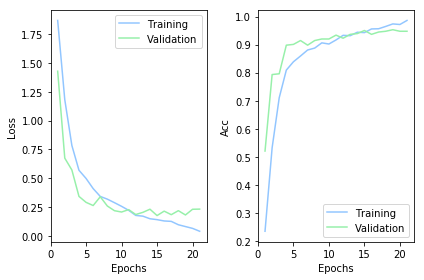

454/454 [==============================] - 0s 207us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3394
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

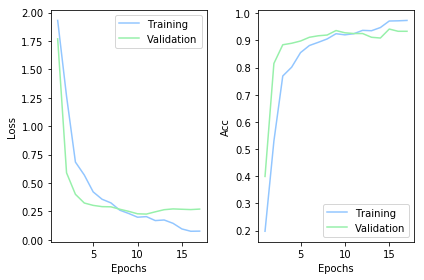

454/454 [==============================] - 0s 185us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3089
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

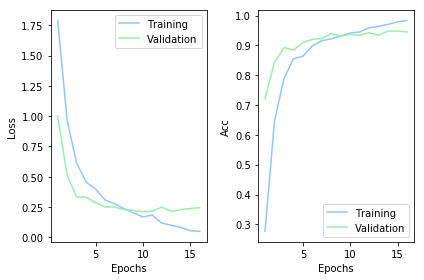

454/454 [==============================] - 0s 181us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3399
Start in layer: conv4_2_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLRO

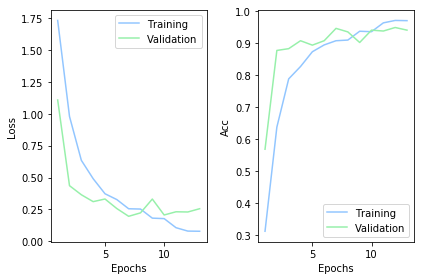

454/454 [==============================] - 0s 171us/step
Post-training accuracy: 87.004 %
Post-training loss: 0.3393
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

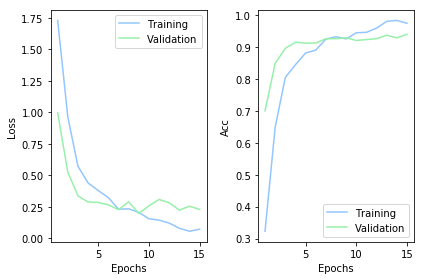

454/454 [==============================] - 0s 205us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.3222
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

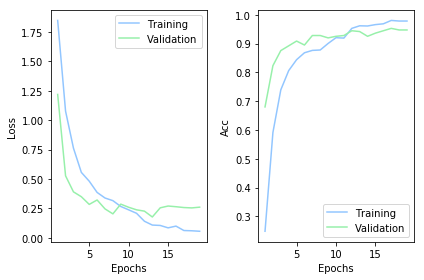

454/454 [==============================] - 0s 172us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.343
Start in layer: activation_42
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impr

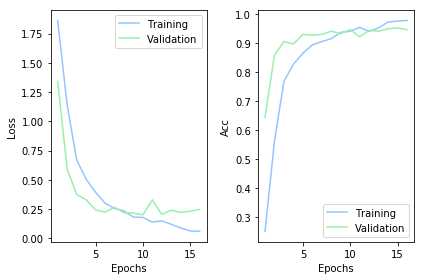

454/454 [==============================] - 0s 185us/step
Post-training accuracy: 91.189 %
Post-training loss: 0.3227
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

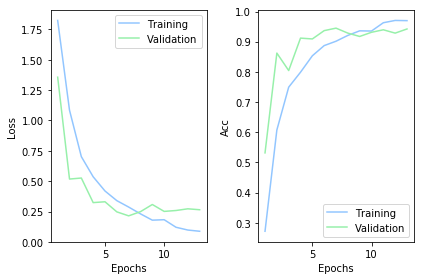

454/454 [==============================] - 0s 178us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.3545
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

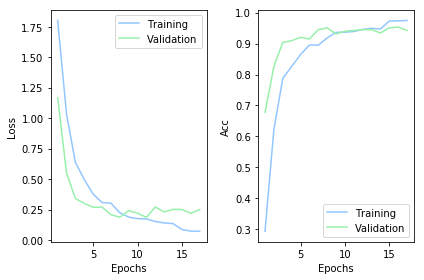

454/454 [==============================] - 0s 180us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3355
Start in layer: conv4_2_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

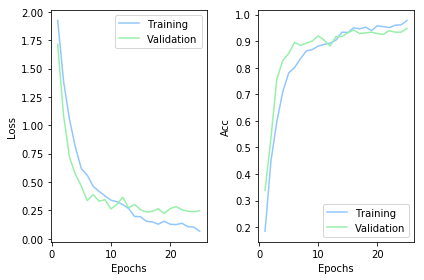

454/454 [==============================] - 0s 178us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.333
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016:

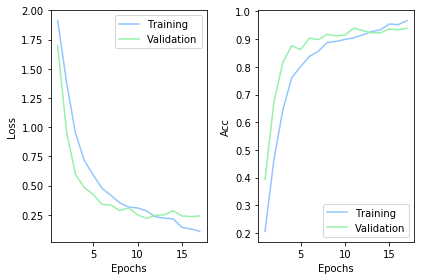

454/454 [==============================] - 0s 176us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3661
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

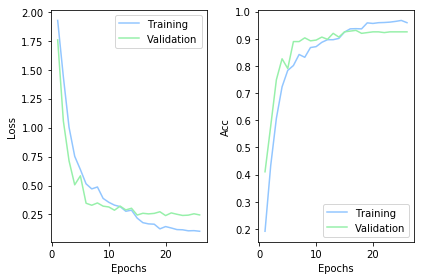

454/454 [==============================] - 0s 194us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3305
Start in layer: conv4_2_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.00

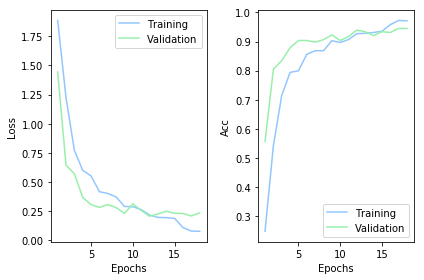

454/454 [==============================] - 0s 181us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3642
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

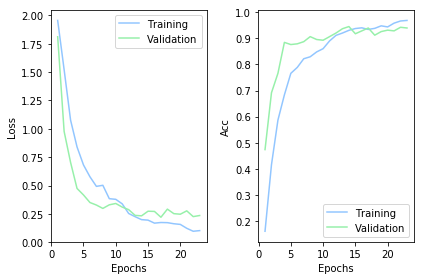

454/454 [==============================] - 0s 209us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3495
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

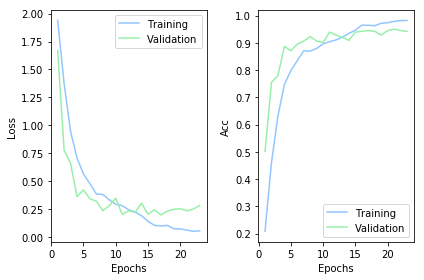

454/454 [==============================] - 0s 185us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3449
Start in layer: activation_43
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the e

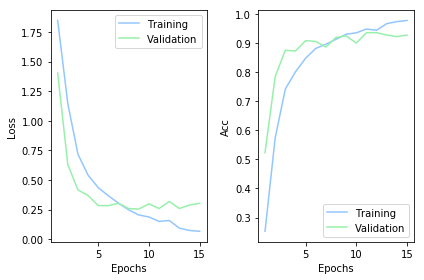

454/454 [==============================] - 0s 178us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.3925
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

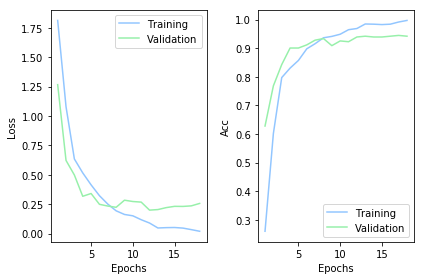

454/454 [==============================] - 0s 212us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.4015
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

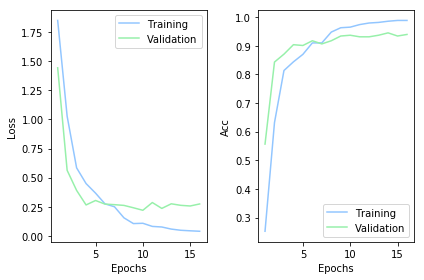

454/454 [==============================] - 0s 216us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3351
Start in layer: conv4_2_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate t

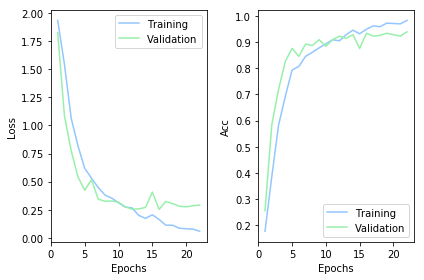

454/454 [==============================] - 0s 381us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3908
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

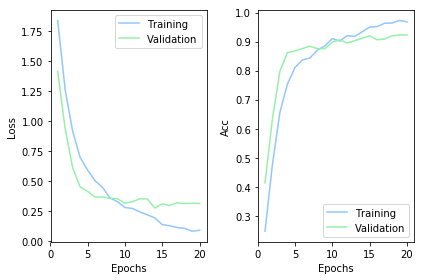

454/454 [==============================] - 0s 405us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.4728
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

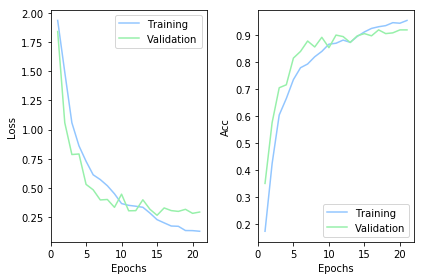

454/454 [==============================] - 0s 445us/step
Post-training accuracy: 87.004 %
Post-training loss: 0.4366
Start in layer: conv4_2_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss d

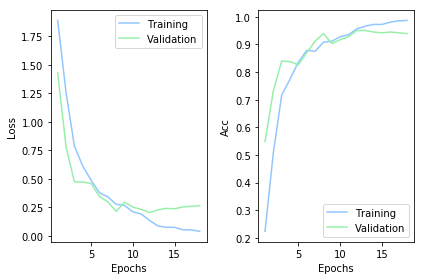

454/454 [==============================] - 0s 379us/step
Post-training accuracy: 86.564 %
Post-training loss: 0.3829
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

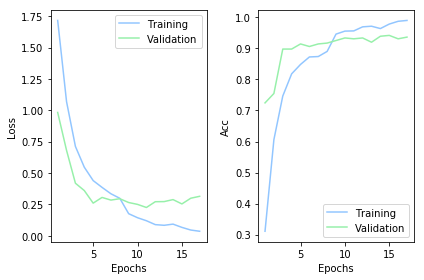

454/454 [==============================] - 0s 386us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3716
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

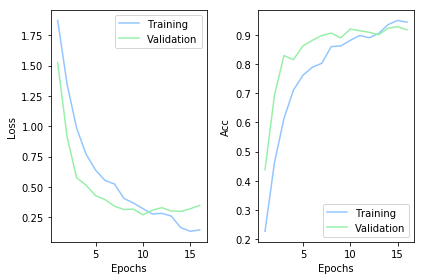

454/454 [==============================] - 0s 412us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3644
Start in layer: multiply_9
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improv

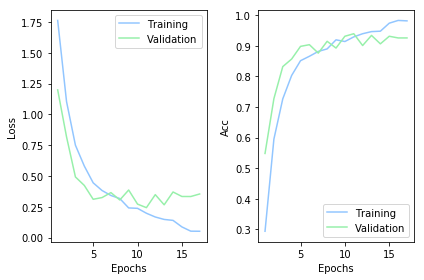

454/454 [==============================] - 0s 430us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.4153
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

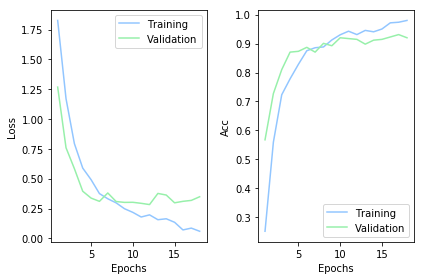

454/454 [==============================] - 0s 386us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3732
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

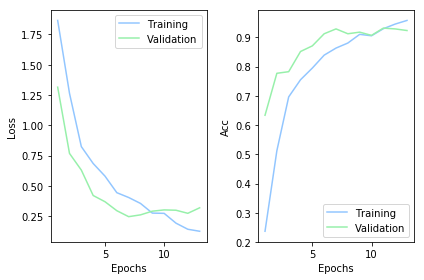

454/454 [==============================] - 0s 425us/step
Post-training accuracy: 85.683 %
Post-training loss: 0.4009
Start in layer: add_9
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing l

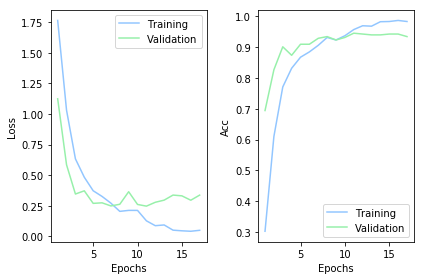

454/454 [==============================] - 0s 397us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3579
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

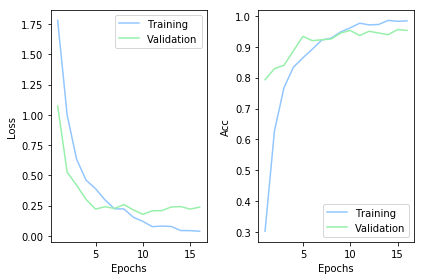

454/454 [==============================] - 0s 392us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3251
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

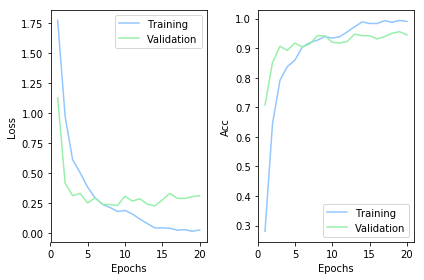

454/454 [==============================] - 0s 390us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.5835
Start in layer: activation_46
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not 

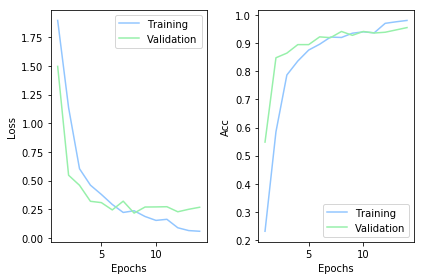

454/454 [==============================] - 0s 412us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.2845
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

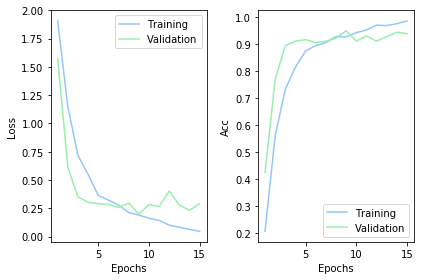

454/454 [==============================] - 0s 388us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3622
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

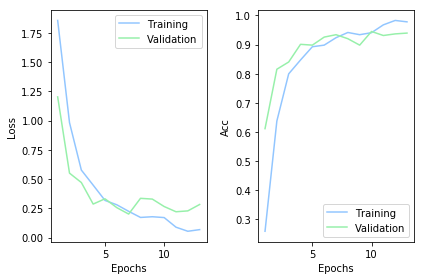

454/454 [==============================] - 0s 438us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3315
Start in layer: conv4_3_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did no

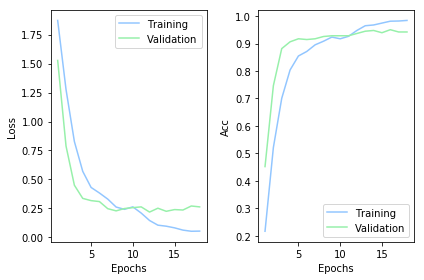

454/454 [==============================] - 0s 253us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3352
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

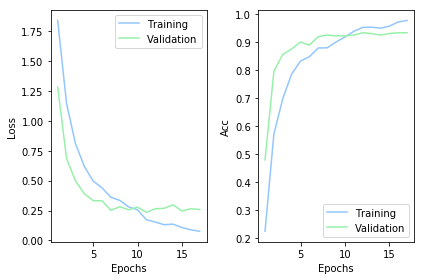

454/454 [==============================] - 0s 194us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3488
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

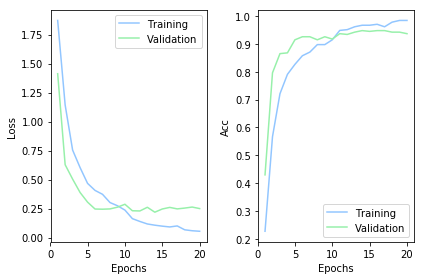

454/454 [==============================] - 0s 196us/step
Post-training accuracy: 91.189 %
Post-training loss: 0.3359
Start in layer: conv4_3_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLRO

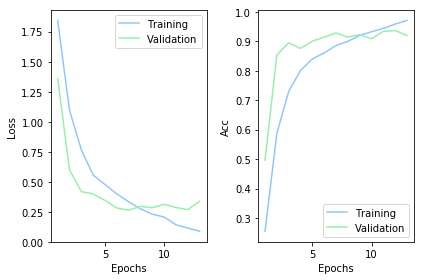

454/454 [==============================] - 0s 196us/step
Post-training accuracy: 86.564 %
Post-training loss: 0.3897
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing 

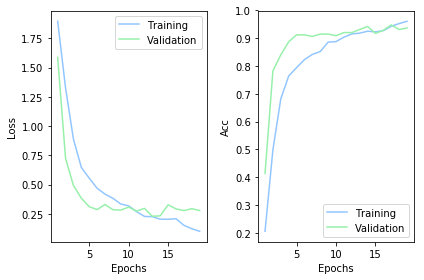

454/454 [==============================] - 0s 203us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3112
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

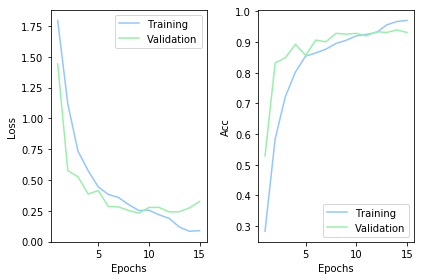

454/454 [==============================] - 0s 212us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3377
Start in layer: activation_47
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00011: early stopping


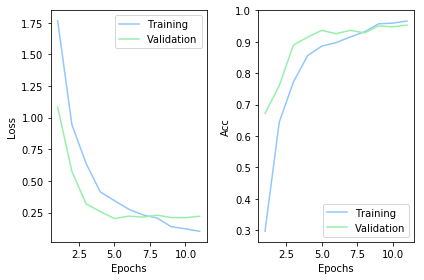

454/454 [==============================] - 0s 227us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3136
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve fr

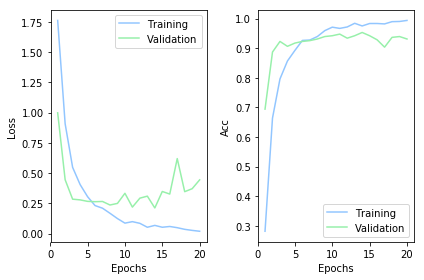

454/454 [==============================] - 0s 220us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3847
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the en

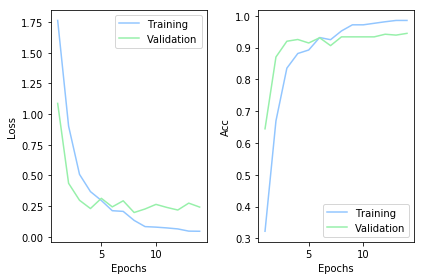

454/454 [==============================] - 0s 245us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.2908
Start in layer: conv4_3_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017:

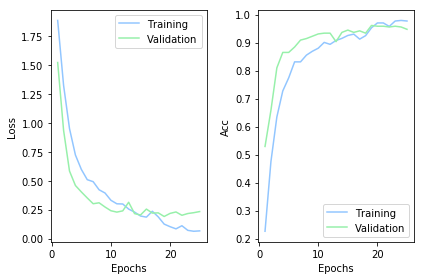

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.3459
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

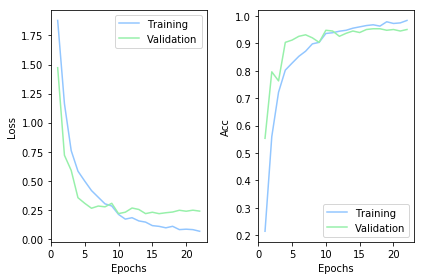

454/454 [==============================] - 0s 212us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3412
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

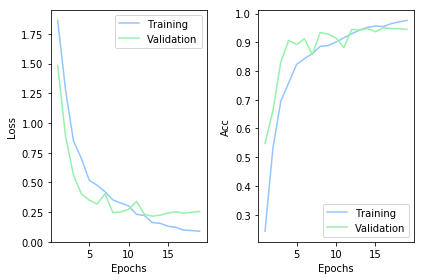

454/454 [==============================] - 0s 214us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.3007
Start in layer: conv4_3_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not im

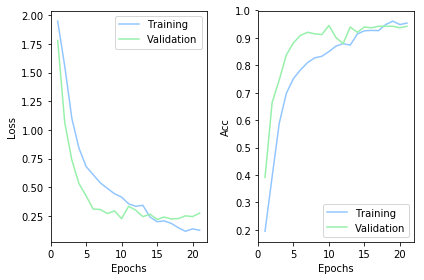

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3578
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

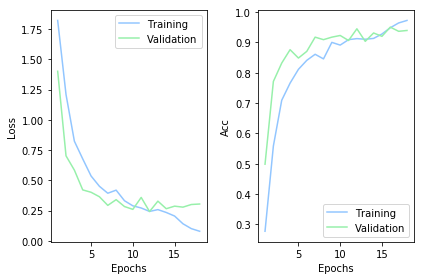

454/454 [==============================] - 0s 227us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3398
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

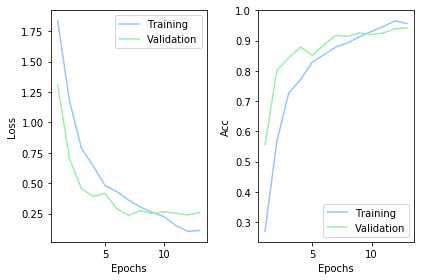

454/454 [==============================] - 0s 220us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.3567
Start in layer: activation_48
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not 

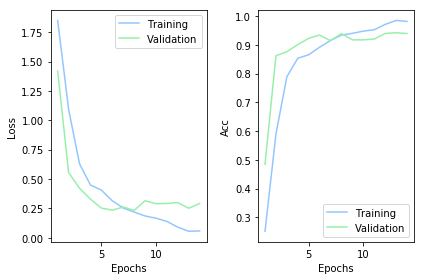

454/454 [==============================] - 0s 231us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3279
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

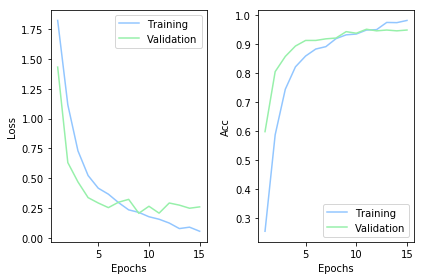

454/454 [==============================] - 0s 220us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3418
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

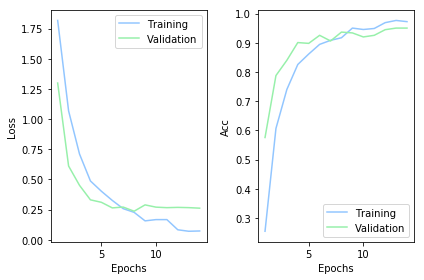

454/454 [==============================] - 0s 223us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3313
Start in layer: conv4_3_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did 

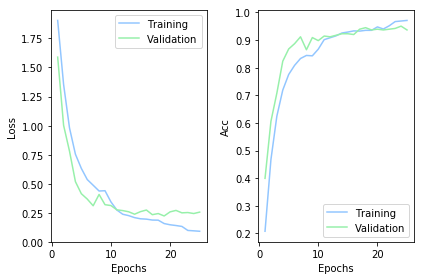

454/454 [==============================] - 0s 421us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3623
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

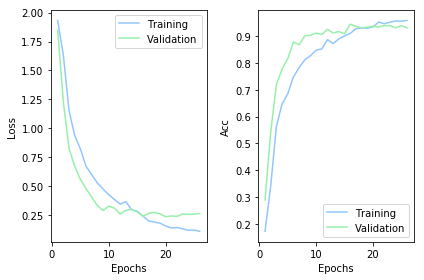

454/454 [==============================] - 0s 427us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3528
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing 

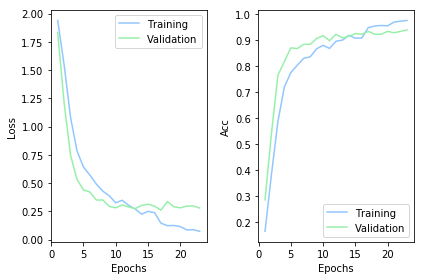

454/454 [==============================] - 0s 436us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3713
Start in layer: conv4_3_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss d

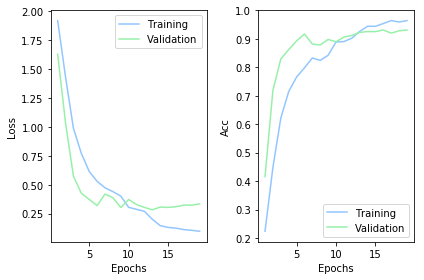

454/454 [==============================] - 0s 427us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3622
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

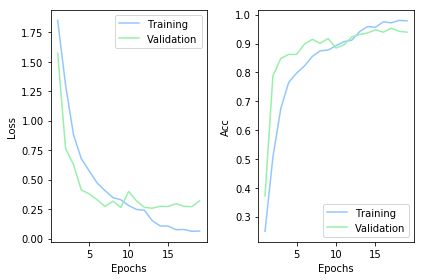

454/454 [==============================] - 0s 427us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3768
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

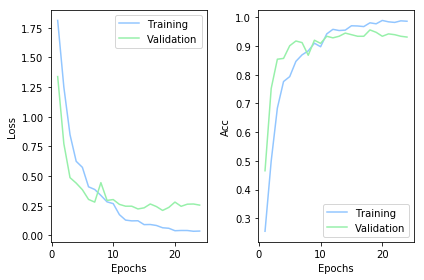

454/454 [==============================] - 0s 436us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.4425
Start in layer: multiply_10
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

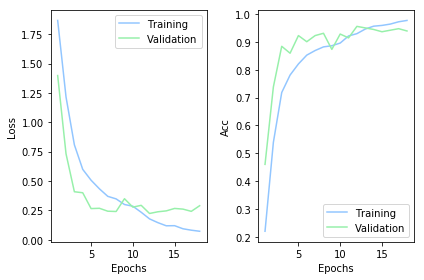

454/454 [==============================] - 0s 441us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.3997
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

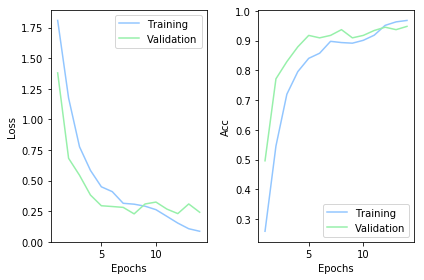

454/454 [==============================] - 0s 442us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3051
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

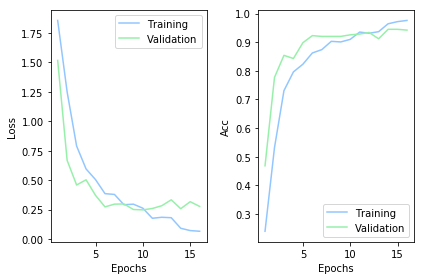

454/454 [==============================] - 0s 443us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3418
Start in layer: add_10
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 000

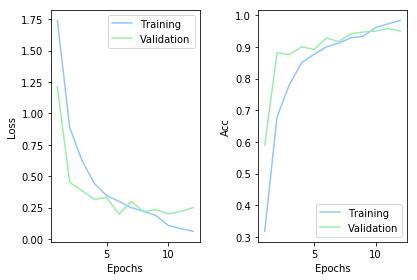

454/454 [==============================] - 0s 557us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.2836
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

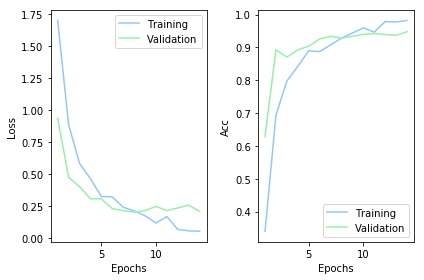

454/454 [==============================] - 0s 441us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.2899
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

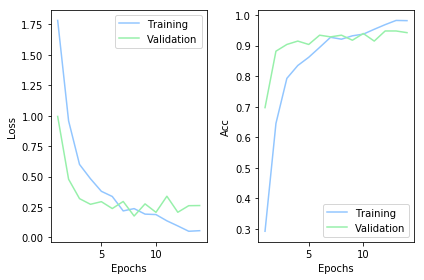

454/454 [==============================] - 0s 445us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.345
Start in layer: activation_51
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the en

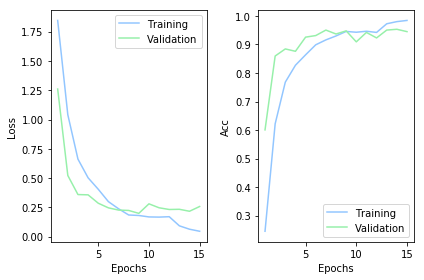

454/454 [==============================] - 0s 449us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3039
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

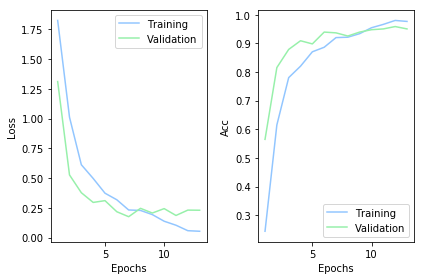

454/454 [==============================] - 0s 456us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3489
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

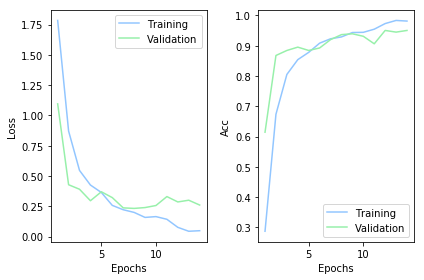

454/454 [==============================] - 0s 465us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3645
Start in layer: conv4_4_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did

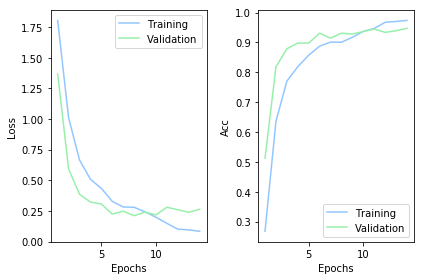

454/454 [==============================] - 0s 242us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3078
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

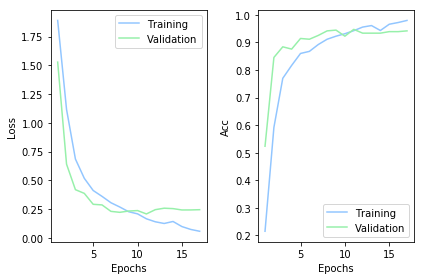

454/454 [==============================] - 0s 264us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3026
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016:

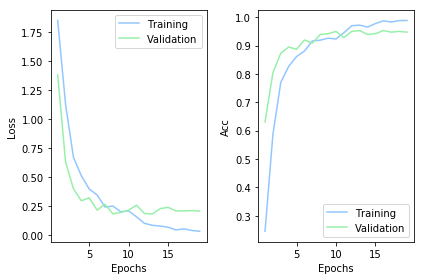

454/454 [==============================] - 0s 240us/step
Post-training accuracy: 91.41 %
Post-training loss: 0.3121
Start in layer: conv4_4_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights fro

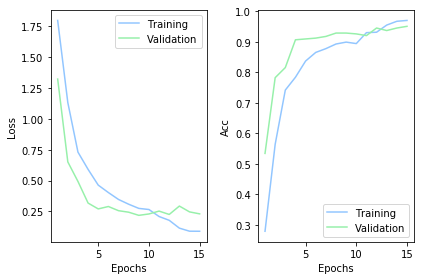

454/454 [==============================] - 0s 264us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3694
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

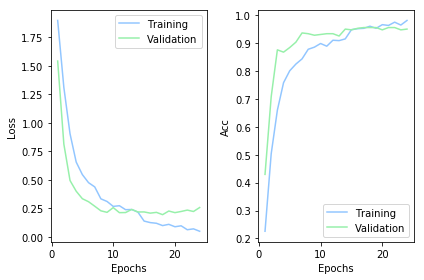

454/454 [==============================] - 0s 267us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3412
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing l

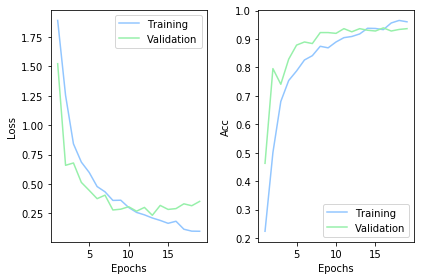

454/454 [==============================] - 0s 284us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3423
Start in layer: activation_52
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the e

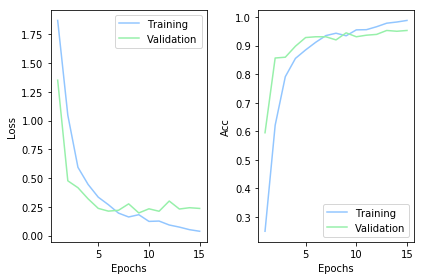

454/454 [==============================] - 0s 247us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3623
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

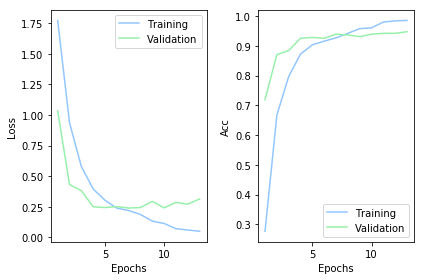

454/454 [==============================] - 0s 242us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3469
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

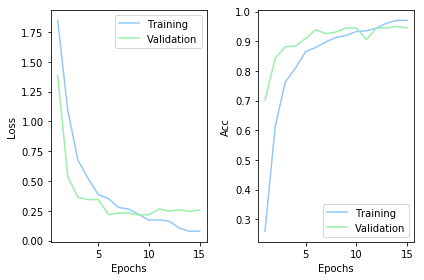

454/454 [==============================] - 0s 319us/step
Post-training accuracy: 91.189 %
Post-training loss: 0.295
Start in layer: conv4_4_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improv

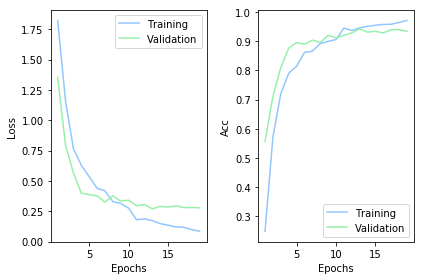

454/454 [==============================] - 0s 247us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3485
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

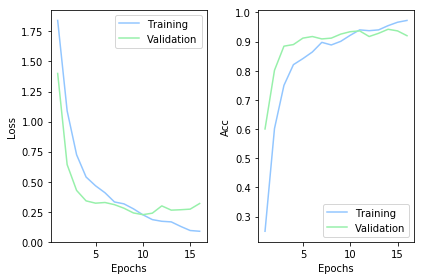

454/454 [==============================] - 0s 251us/step
Post-training accuracy: 87.225 %
Post-training loss: 0.4299
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

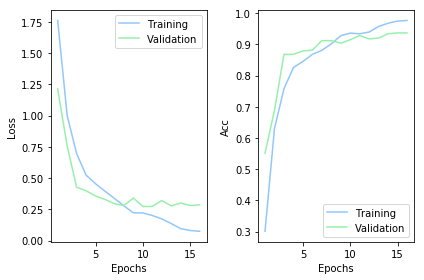

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.333
Start in layer: conv4_4_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

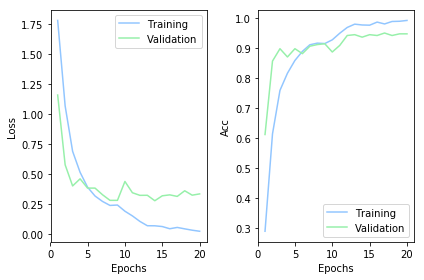

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.4565
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

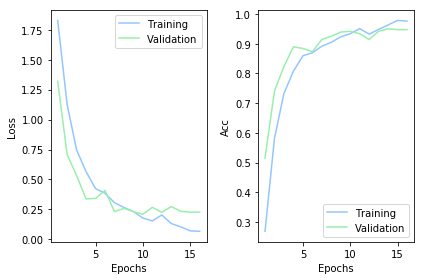

454/454 [==============================] - 0s 251us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3754
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

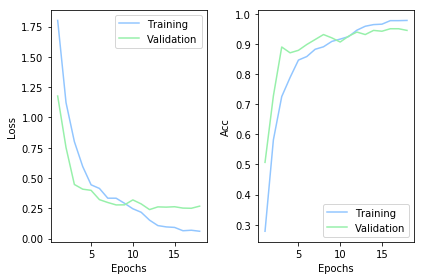

454/454 [==============================] - 0s 260us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3922
Start in layer: activation_53
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not 

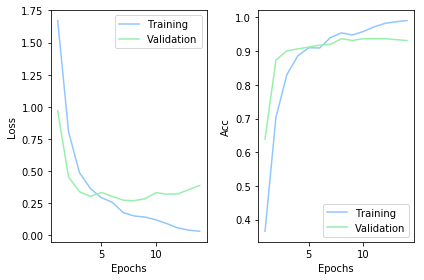

454/454 [==============================] - 0s 251us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.4007
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

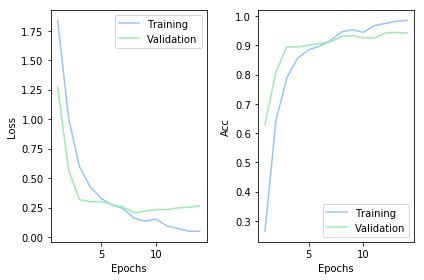

454/454 [==============================] - 0s 252us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.343
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 000

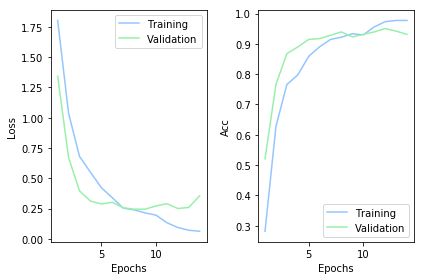

454/454 [==============================] - 0s 258us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3103
Start in layer: conv4_4_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did 

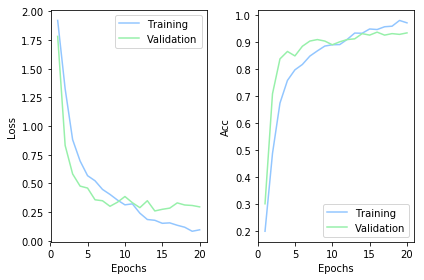

454/454 [==============================] - 0s 480us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.4346
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

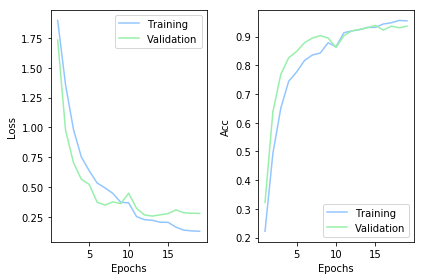

454/454 [==============================] - 0s 482us/step
Post-training accuracy: 87.225 %
Post-training loss: 0.4359
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

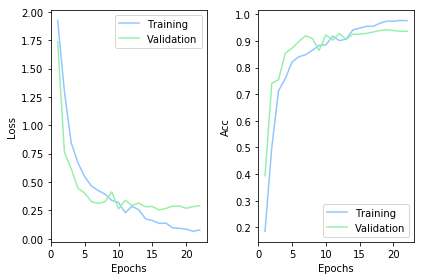

454/454 [==============================] - 0s 478us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.4648
Start in layer: conv4_4_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rat

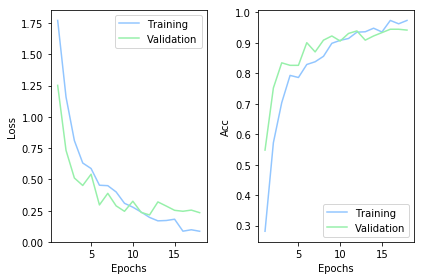

454/454 [==============================] - 0s 491us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3382
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

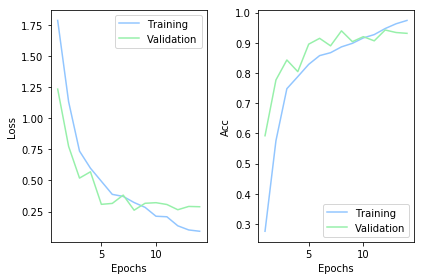

454/454 [==============================] - 0s 496us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3515
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

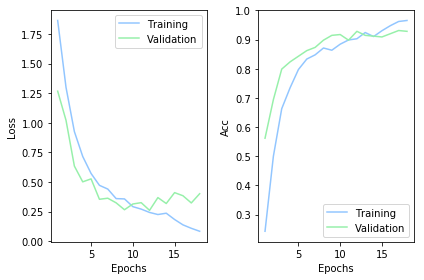

454/454 [==============================] - 0s 500us/step
Post-training accuracy: 87.004 %
Post-training loss: 0.3757
Start in layer: multiply_11
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not impro

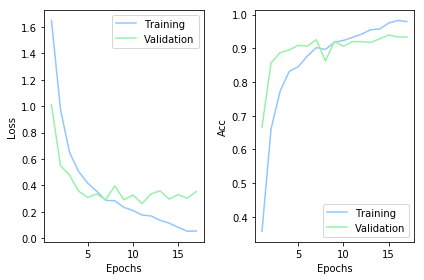

454/454 [==============================] - 0s 505us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.399
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 000

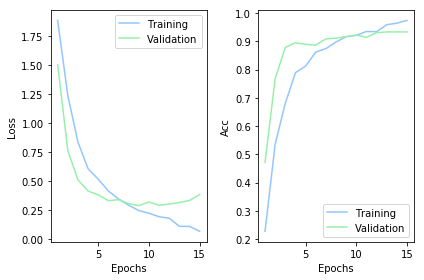

454/454 [==============================] - 0s 518us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3664
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

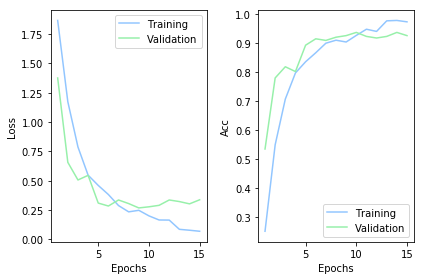

454/454 [==============================] - 0s 518us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3962
Start in layer: add_11
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring mo

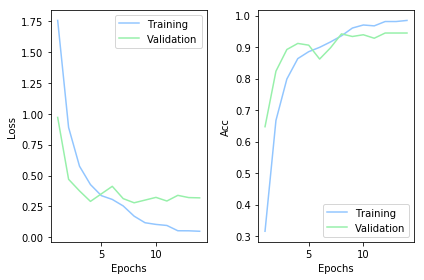

454/454 [==============================] - 0s 507us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3226
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

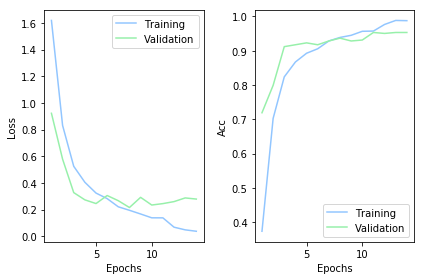

454/454 [==============================] - 0s 498us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3888
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


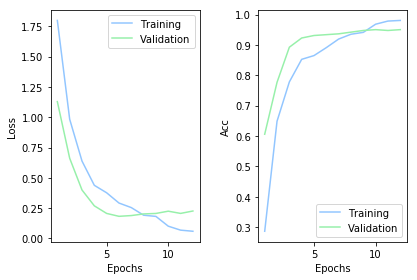

454/454 [==============================] - 0s 516us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3158
Start in layer: activation_56
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau re

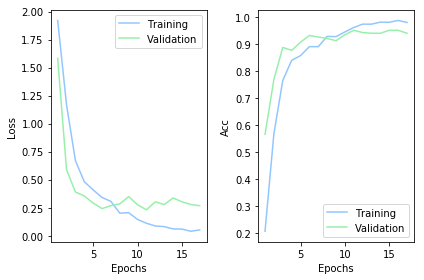

454/454 [==============================] - 0s 524us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.2809
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

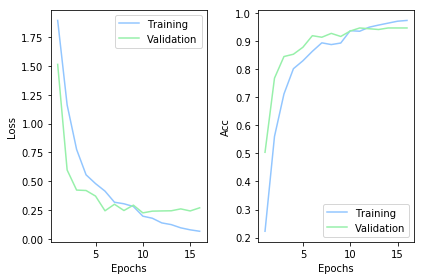

454/454 [==============================] - 0s 533us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3245
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


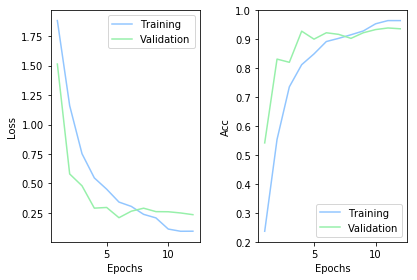

454/454 [==============================] - 0s 531us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3428
Start in layer: conv4_5_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did no

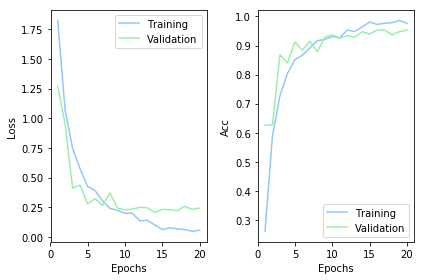

454/454 [==============================] - 0s 293us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.4249
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing 

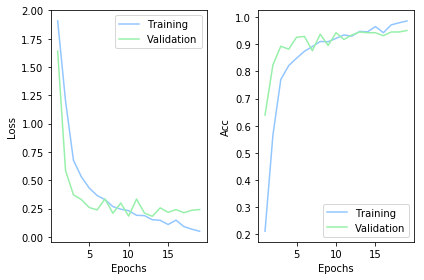

454/454 [==============================] - 0s 350us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3266
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

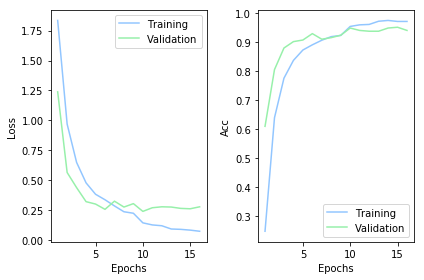

454/454 [==============================] - 0s 317us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3694
Start in layer: conv4_5_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss 

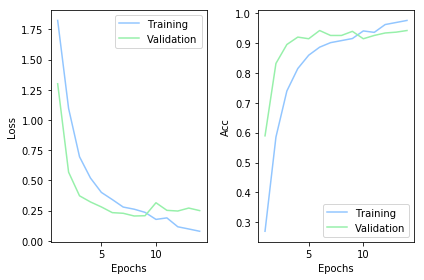

454/454 [==============================] - 0s 295us/step
Post-training accuracy: 85.683 %
Post-training loss: 0.3552
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

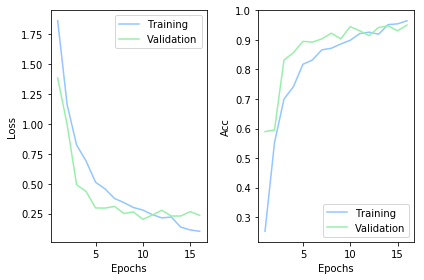

454/454 [==============================] - 0s 292us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3981
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

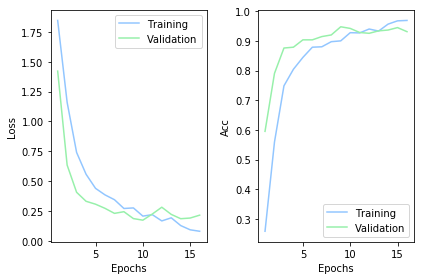

454/454 [==============================] - 0s 381us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3992
Start in layer: activation_57
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau

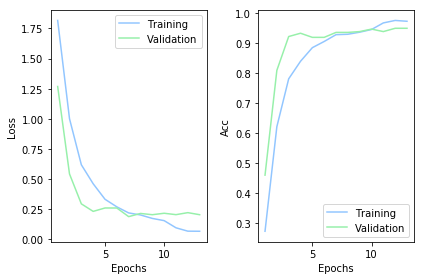

454/454 [==============================] - 0s 308us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3265
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

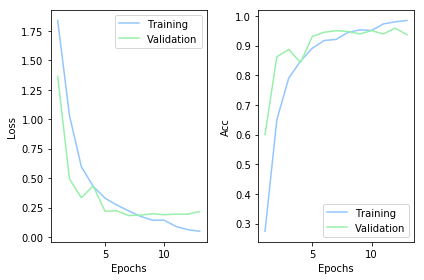

454/454 [==============================] - 0s 313us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3829
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

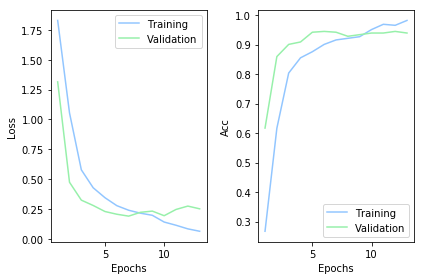

454/454 [==============================] - 0s 319us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.3295
Start in layer: conv4_5_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017:

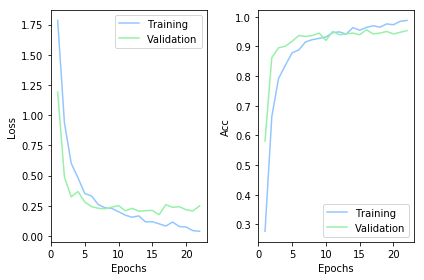

454/454 [==============================] - 0s 333us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.4549
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

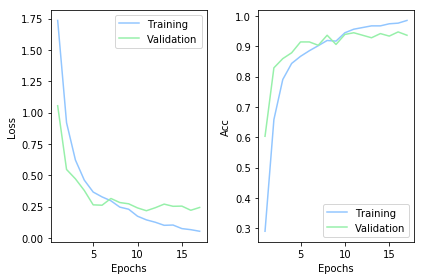

454/454 [==============================] - 0s 308us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3351
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

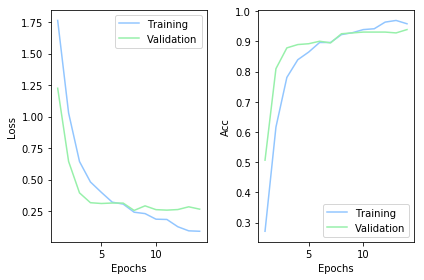

454/454 [==============================] - 0s 315us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.368
Start in layer: conv4_5_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

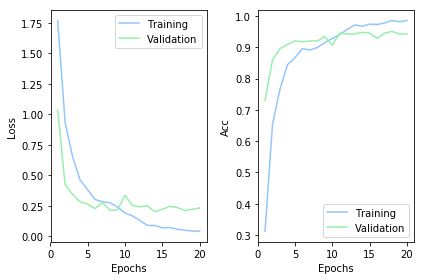

454/454 [==============================] - 0s 328us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3513
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

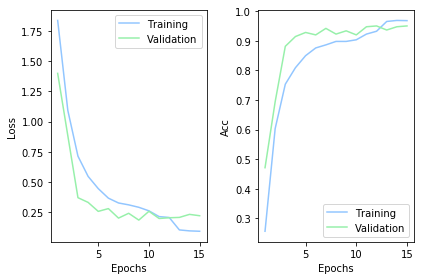

454/454 [==============================] - 0s 322us/step
Post-training accuracy: 86.564 %
Post-training loss: 0.4167
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

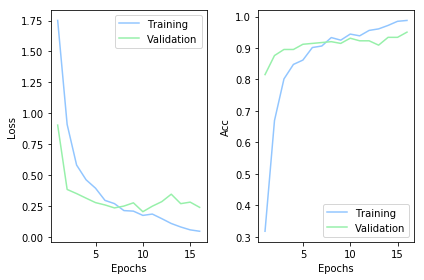

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3352
Start in layer: activation_58
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not imp

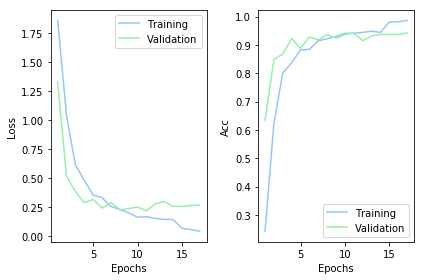

454/454 [==============================] - 0s 315us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.4091
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

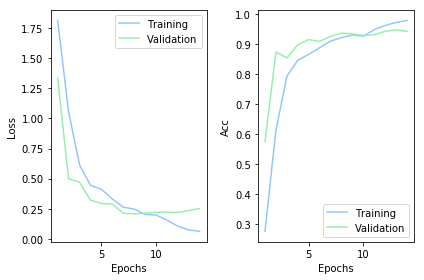

454/454 [==============================] - 0s 308us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3071
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

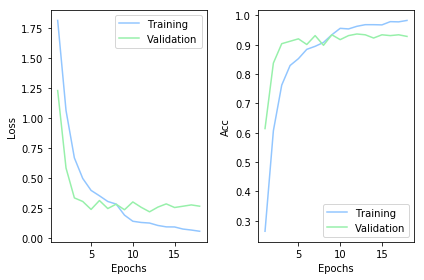

454/454 [==============================] - 0s 311us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3429
Start in layer: conv4_5_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00013: val_loss did not improve from 0.1613

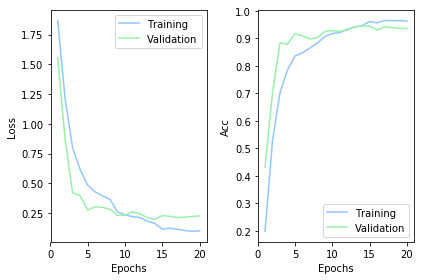

454/454 [==============================] - 0s 582us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3761
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

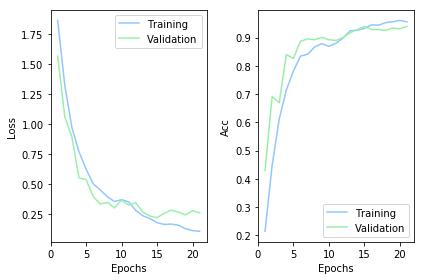

454/454 [==============================] - 0s 588us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3974
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

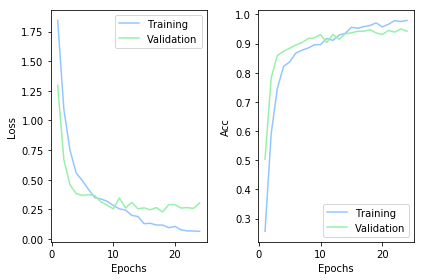

454/454 [==============================] - 0s 593us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.3823
Start in layer: conv4_5_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights 

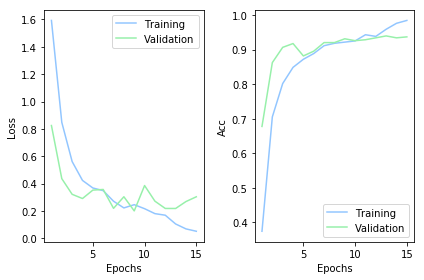

454/454 [==============================] - 0s 579us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3812
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the en

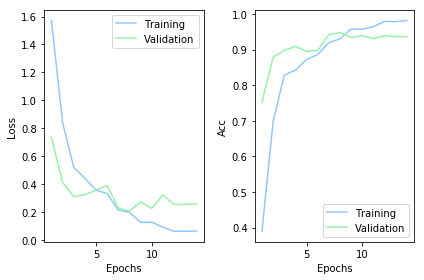

454/454 [==============================] - 0s 573us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3669
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

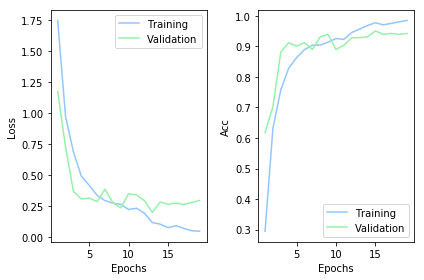

454/454 [==============================] - 0s 582us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.4323
Start in layer: multiply_12
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 

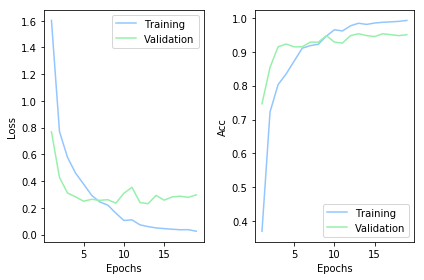

454/454 [==============================] - 0s 595us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.4
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: va

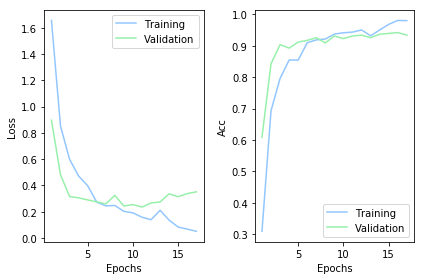

454/454 [==============================] - 0s 604us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.4055
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

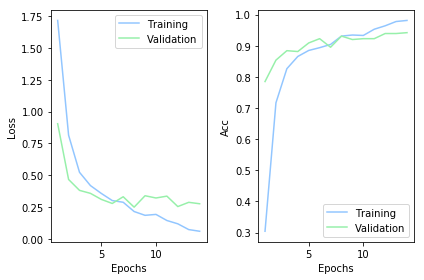

454/454 [==============================] - 0s 608us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.4347
Start in layer: add_12
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing 

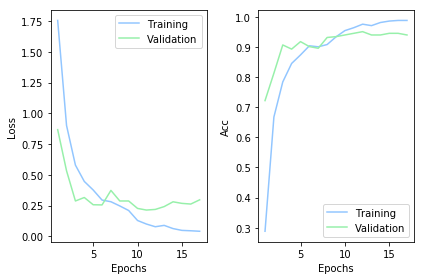

454/454 [==============================] - 0s 582us/step
Post-training accuracy: 92.07 %
Post-training loss: 0.3982
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015:

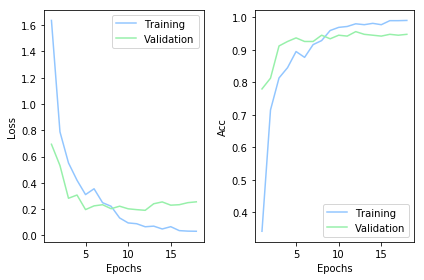

454/454 [==============================] - 0s 586us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.456
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.00025

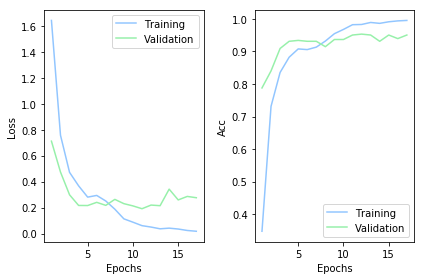

454/454 [==============================] - 0s 665us/step
Post-training accuracy: 92.07 %
Post-training loss: 0.3906
Start in layer: activation_61
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau red

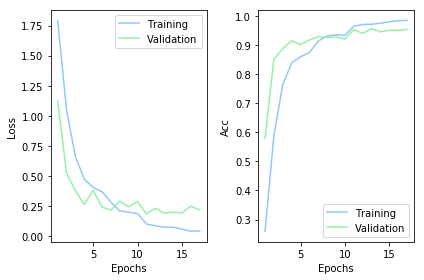

454/454 [==============================] - 0s 612us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.449
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016:

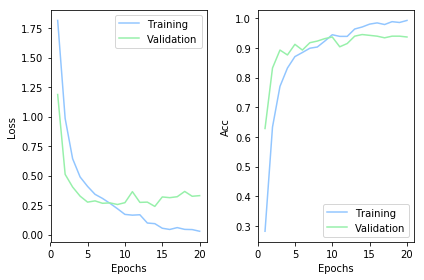

454/454 [==============================] - 0s 623us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.4462
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

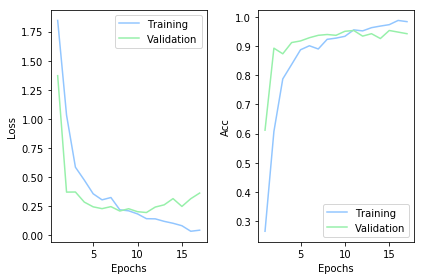

454/454 [==============================] - 0s 615us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.2721
Start in layer: conv4_6_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch

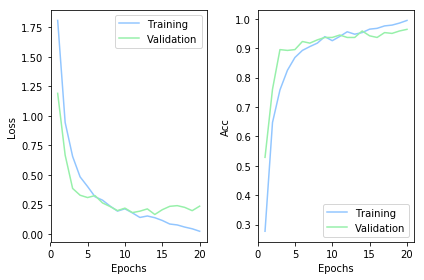

454/454 [==============================] - 0s 337us/step
Post-training accuracy: 91.41 %
Post-training loss: 0.3194
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mod

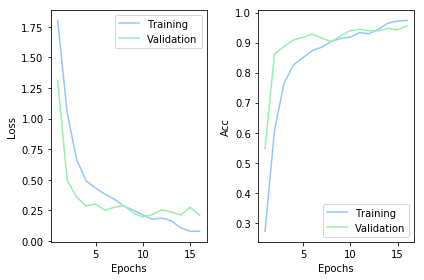

454/454 [==============================] - 0s 353us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3541
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

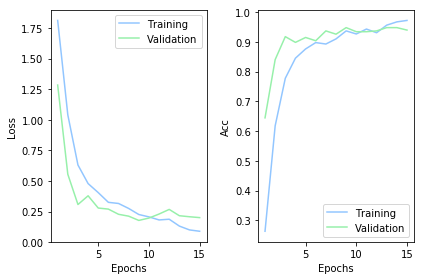

454/454 [==============================] - 0s 341us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3475
Start in layer: conv4_6_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss 

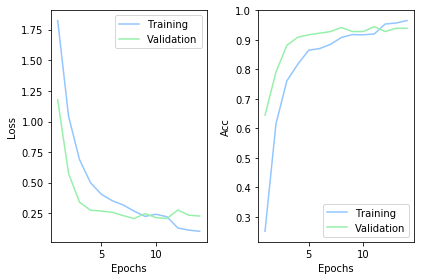

454/454 [==============================] - 0s 348us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3051
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

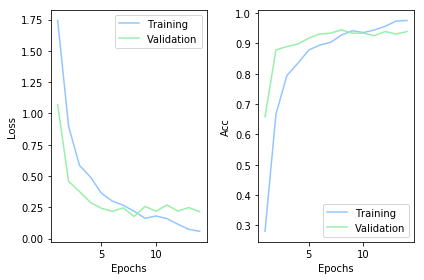

454/454 [==============================] - 0s 379us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3335
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

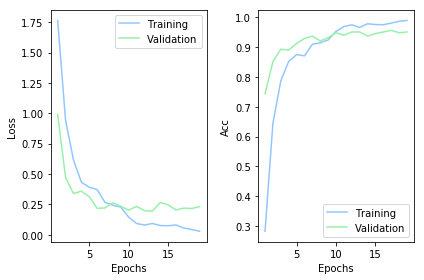

454/454 [==============================] - 0s 350us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3914
Start in layer: activation_62
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not 

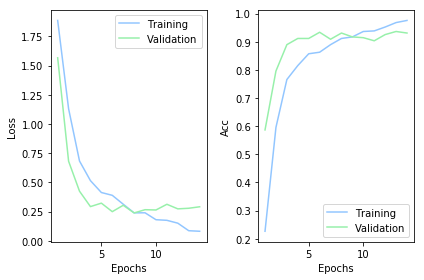

454/454 [==============================] - 0s 375us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.337
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


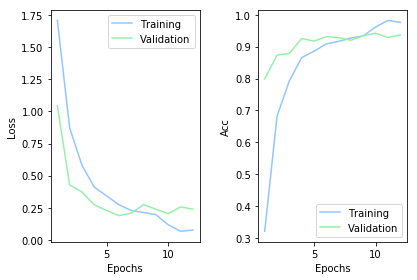

454/454 [==============================] - 0s 359us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3287
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

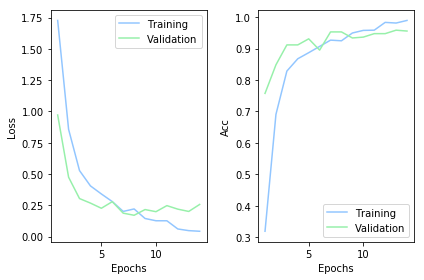

454/454 [==============================] - 0s 390us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.3494
Start in layer: conv4_6_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

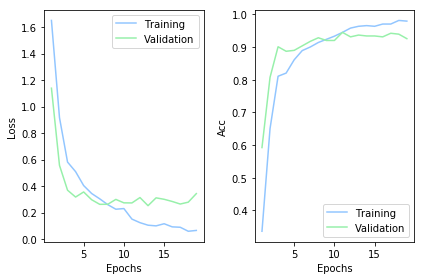

454/454 [==============================] - 0s 359us/step
Post-training accuracy: 91.41 %
Post-training loss: 0.2749
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 000

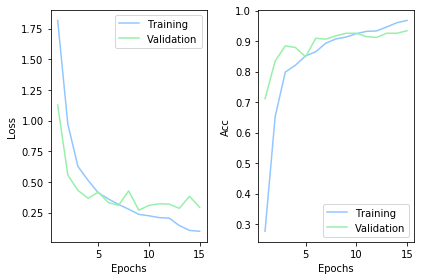

454/454 [==============================] - 0s 364us/step
Post-training accuracy: 87.665 %
Post-training loss: 0.3818
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

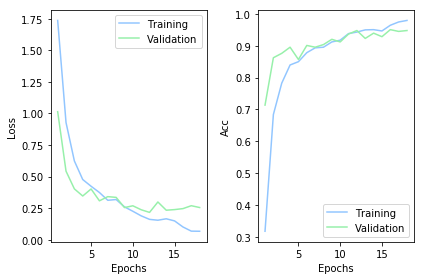

454/454 [==============================] - 0s 353us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3148
Start in layer: conv4_6_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not im

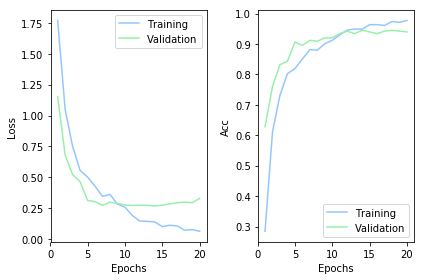

454/454 [==============================] - 0s 397us/step
Post-training accuracy: 92.291 %
Post-training loss: 0.2941
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

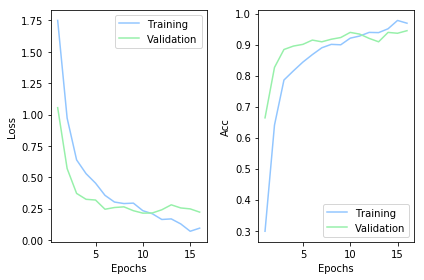

454/454 [==============================] - 0s 363us/step
Post-training accuracy: 87.665 %
Post-training loss: 0.3315
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

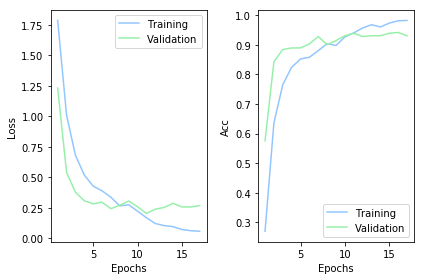

454/454 [==============================] - 0s 368us/step
Post-training accuracy: 91.41 %
Post-training loss: 0.3178
Start in layer: activation_63
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau 

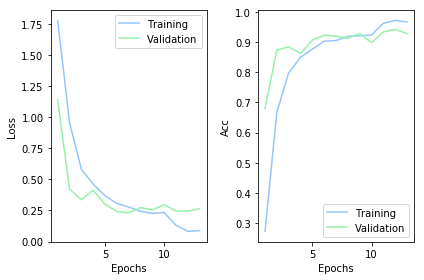

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3222
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

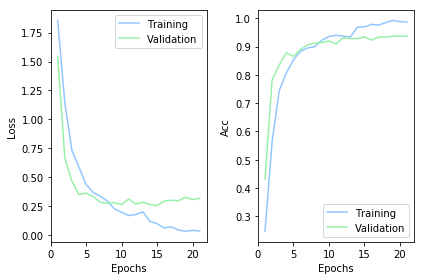

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 92.511 %
Post-training loss: 0.3201
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

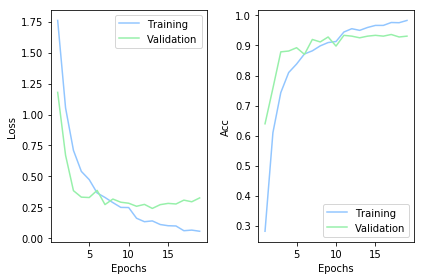

454/454 [==============================] - 0s 366us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3119
Start in layer: conv4_6_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did 

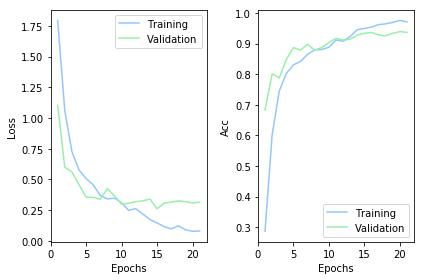

454/454 [==============================] - 0s 639us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3841
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

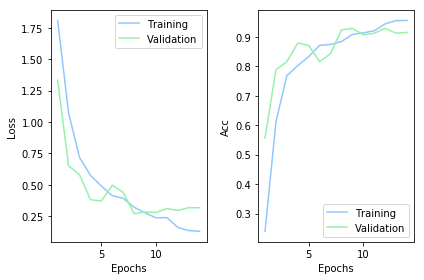

454/454 [==============================] - 0s 639us/step
Post-training accuracy: 87.225 %
Post-training loss: 0.4098
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

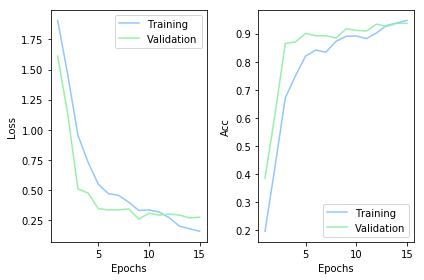

454/454 [==============================] - 0s 648us/step
Post-training accuracy: 86.784 %
Post-training loss: 0.3598
Start in layer: conv4_6_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743

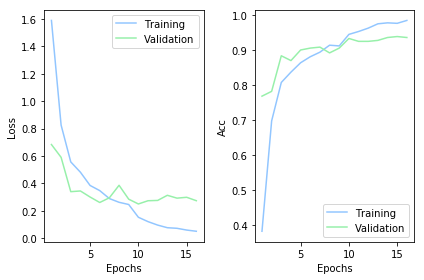

454/454 [==============================] - 0s 646us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3445
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

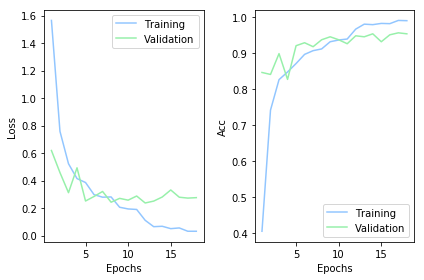

454/454 [==============================] - 0s 657us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3782
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

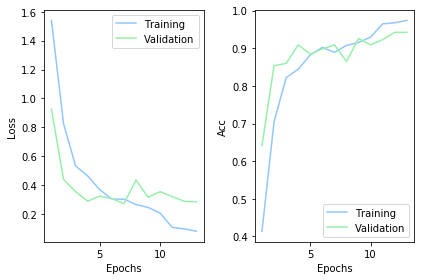

454/454 [==============================] - 0s 661us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3843
Start in layer: multiply_13
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

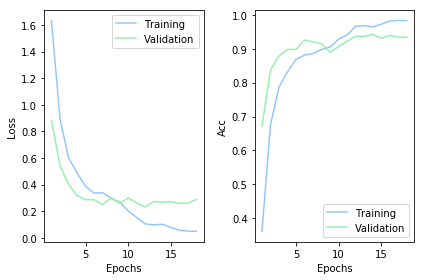

454/454 [==============================] - 0s 648us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.3756
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

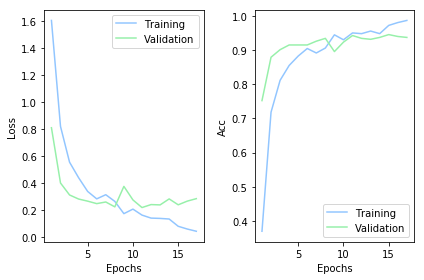

454/454 [==============================] - 0s 659us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3725
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


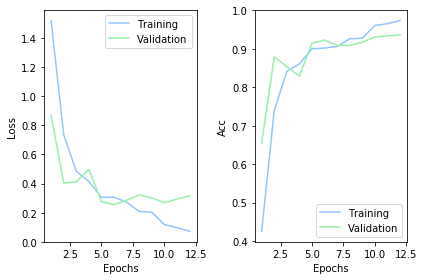

454/454 [==============================] - 0s 652us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.4122
Start in layer: add_13
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve fr

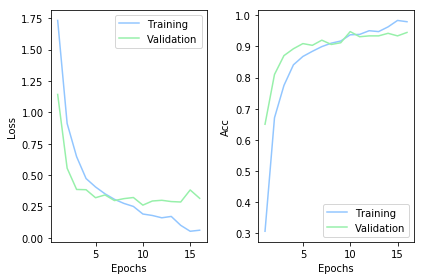

454/454 [==============================] - 0s 661us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.4347
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


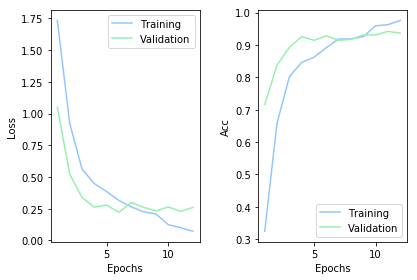

454/454 [==============================] - 0s 674us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.3609
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

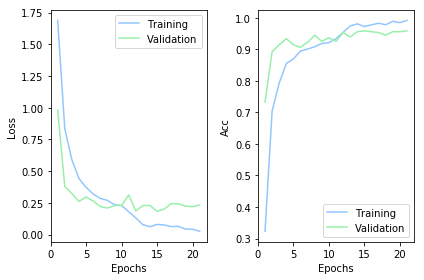

454/454 [==============================] - 0s 668us/step
Post-training accuracy: 90.969 %
Post-training loss: 0.3965
Start in layer: activation_66
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau re

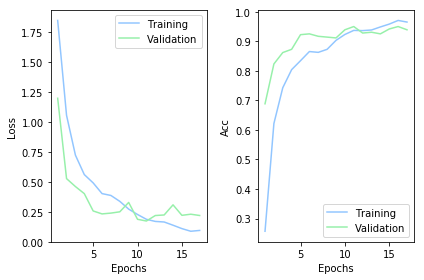

454/454 [==============================] - 0s 694us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3747
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

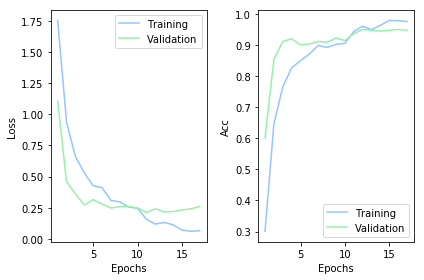

454/454 [==============================] - 0s 659us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3455
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

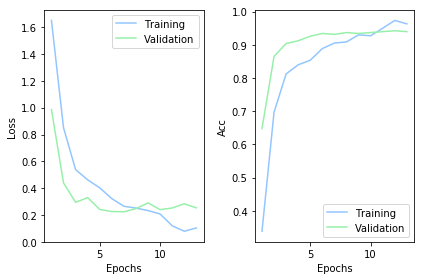

454/454 [==============================] - 0s 659us/step
Post-training accuracy: 85.242 %
Post-training loss: 0.4166
Start in layer: conv5_1_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did no

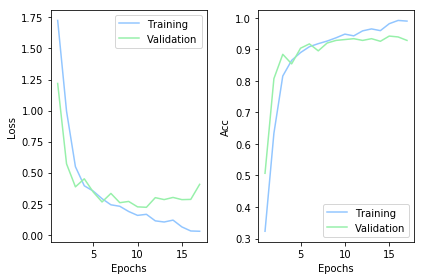

454/454 [==============================] - 0s 236us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3689
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

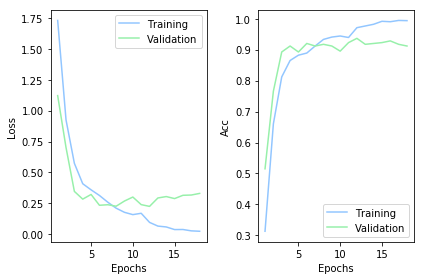

454/454 [==============================] - 0s 256us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3517
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve fr

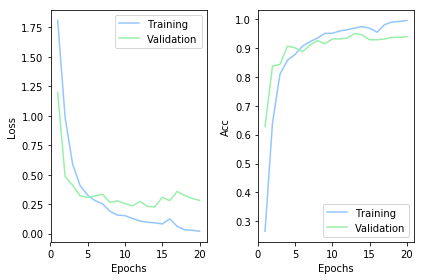

454/454 [==============================] - 0s 242us/step
Post-training accuracy: 90.749 %
Post-training loss: 0.3584
Start in layer: conv5_1_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLRO

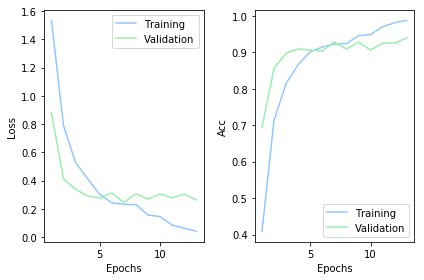

454/454 [==============================] - 0s 247us/step
Post-training accuracy: 90.529 %
Post-training loss: 0.3275
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

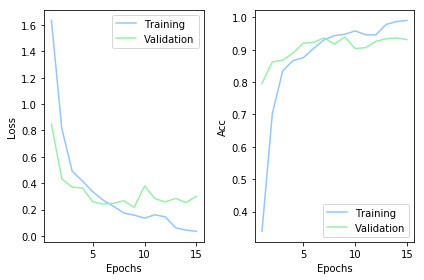

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3848
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

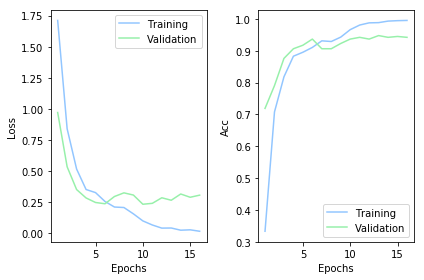

454/454 [==============================] - 0s 245us/step
Post-training accuracy: 91.63 %
Post-training loss: 0.3372
Start in layer: activation_67
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epo

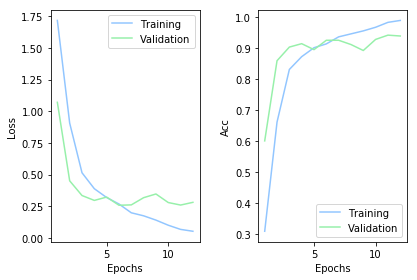

454/454 [==============================] - 0s 247us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3335
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

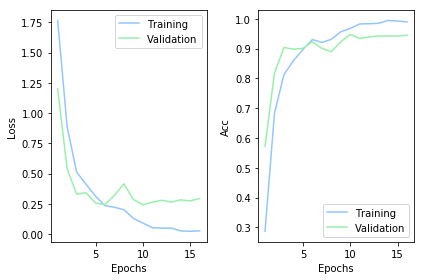

454/454 [==============================] - 0s 245us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3458
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

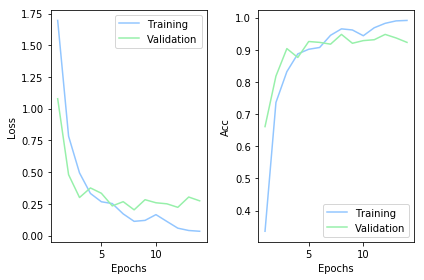

454/454 [==============================] - 0s 245us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.4051
Start in layer: conv5_1_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

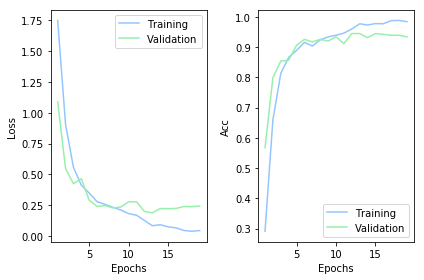

454/454 [==============================] - 0s 251us/step
Post-training accuracy: 90.088 %
Post-training loss: 0.3736
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

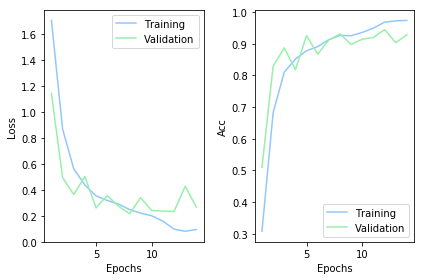

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3461
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

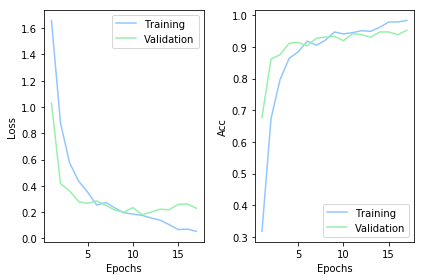

454/454 [==============================] - 0s 258us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3724
Start in layer: conv5_1_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau r

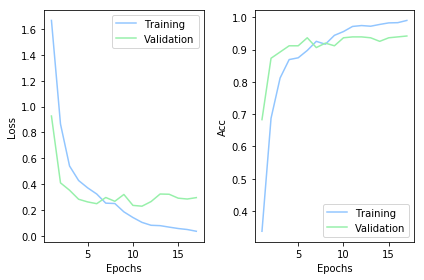

454/454 [==============================] - 0s 256us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3481
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


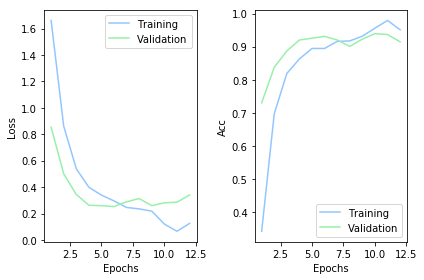

454/454 [==============================] - 0s 256us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.387
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016:

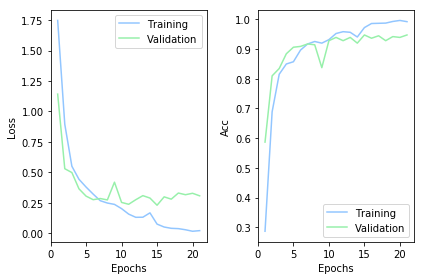

454/454 [==============================] - 0s 249us/step
Post-training accuracy: 92.07 %
Post-training loss: 0.306
Start in layer: activation_68
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau r

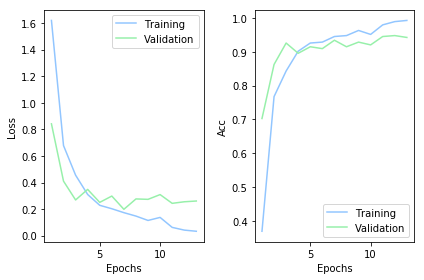

454/454 [==============================] - 0s 250us/step
Post-training accuracy: 90.308 %
Post-training loss: 0.306
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


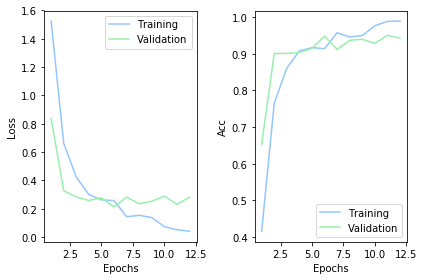

454/454 [==============================] - 0s 253us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3331
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

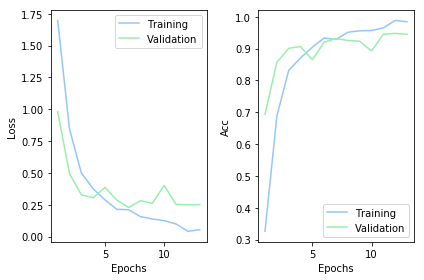

454/454 [==============================] - 0s 284us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3589
Start in layer: conv5_1_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did 

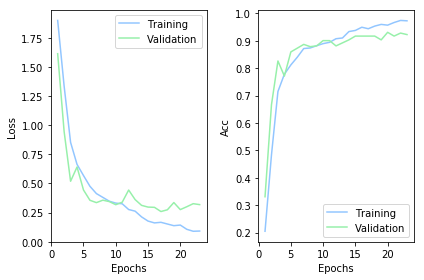

454/454 [==============================] - 0s 403us/step
Post-training accuracy: 89.207 %
Post-training loss: 0.3471
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

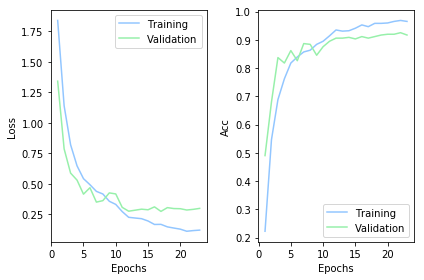

454/454 [==============================] - 0s 397us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.3558
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

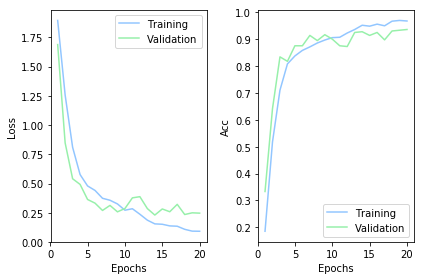

454/454 [==============================] - 0s 405us/step
Post-training accuracy: 91.41 %
Post-training loss: 0.3226
Start in layer: conv5_1_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss di

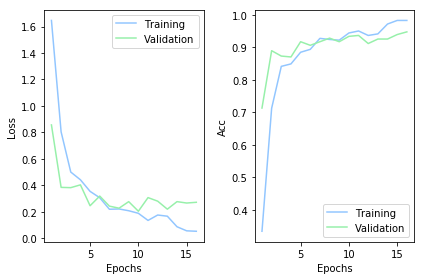

454/454 [==============================] - 0s 401us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.34
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: 

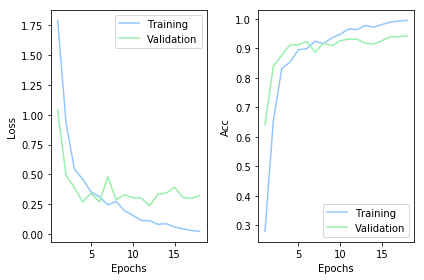

454/454 [==============================] - 0s 405us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.4096
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not i

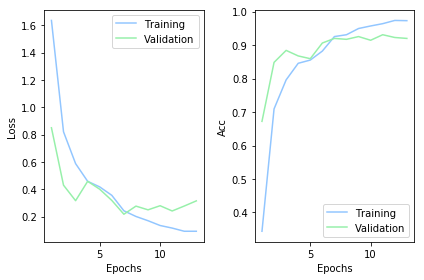

454/454 [==============================] - 0s 423us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3142
Start in layer: conv5_1_1x1_proj
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.

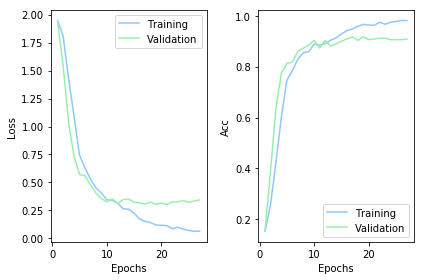

454/454 [==============================] - 0s 421us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.4072
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing 

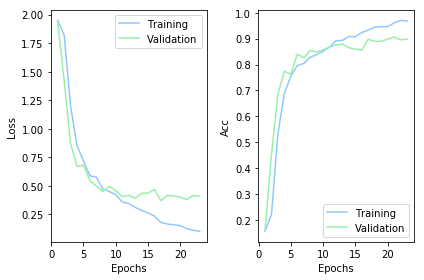

454/454 [==============================] - 0s 421us/step
Post-training accuracy: 85.463 %
Post-training loss: 0.4471
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

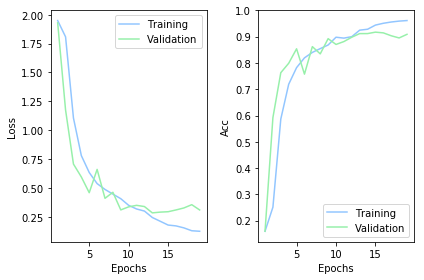

454/454 [==============================] - 0s 412us/step
Post-training accuracy: 87.665 %
Post-training loss: 0.3741
Start in layer: multiply_14
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

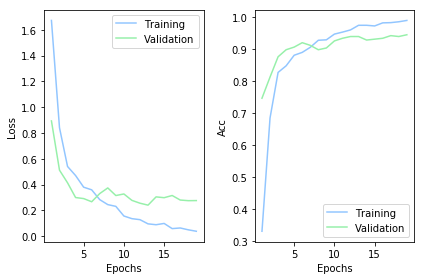

454/454 [==============================] - 0s 423us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.4338
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

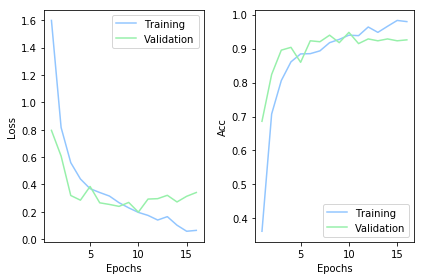

454/454 [==============================] - 0s 425us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3449
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

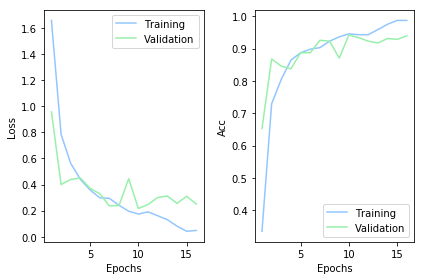

454/454 [==============================] - 0s 405us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.3824
Start in layer: conv5_1_1x1_proj/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoc

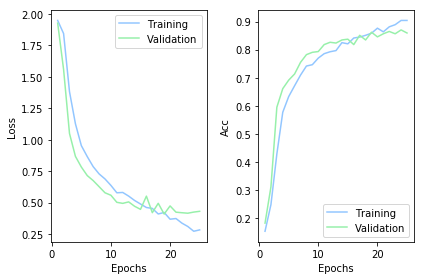

454/454 [==============================] - 0s 414us/step
Post-training accuracy: 83.26 %
Post-training loss: 0.5148
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016:

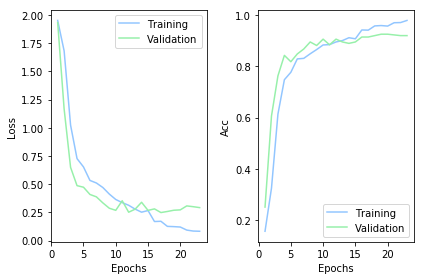

454/454 [==============================] - 0s 412us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.4111
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

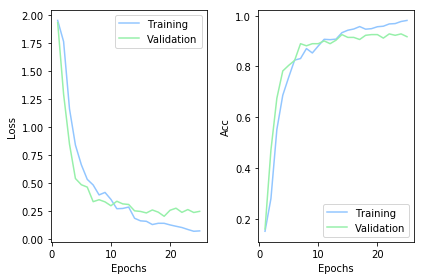

454/454 [==============================] - 0s 410us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.381
Start in layer: add_14
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve fro

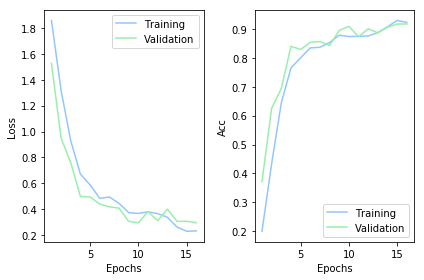

454/454 [==============================] - 0s 458us/step
Post-training accuracy: 86.344 %
Post-training loss: 0.4042
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve fr

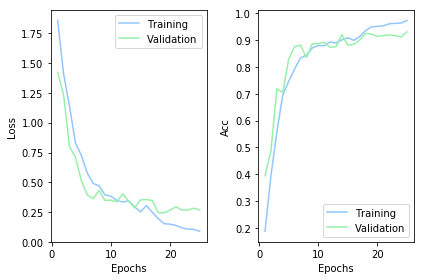

454/454 [==============================] - 0s 454us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3722
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

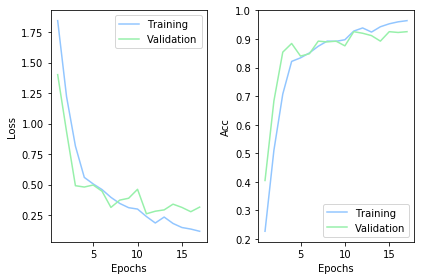

454/454 [==============================] - 0s 452us/step
Post-training accuracy: 85.683 %
Post-training loss: 0.3831
Start in layer: activation_71
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Resto

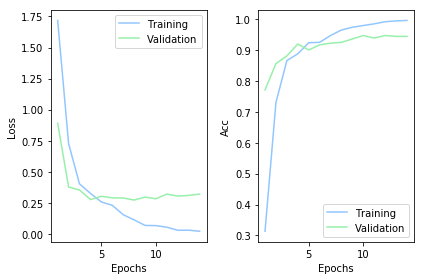

454/454 [==============================] - 0s 584us/step
Post-training accuracy: 89.868 %
Post-training loss: 0.4291
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

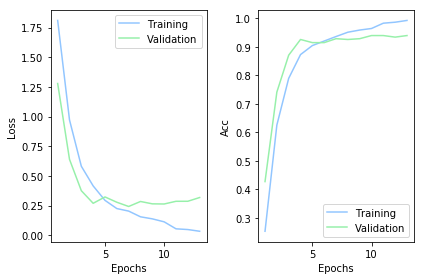

454/454 [==============================] - 0s 463us/step
Post-training accuracy: 89.648 %
Post-training loss: 0.3517
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00011: early stopping


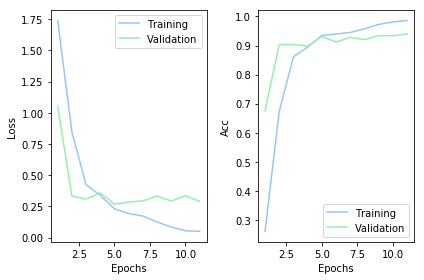

454/454 [==============================] - 0s 430us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3431
Start in layer: conv5_2_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 

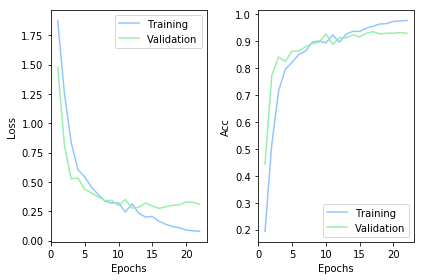

454/454 [==============================] - 0s 315us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3991
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

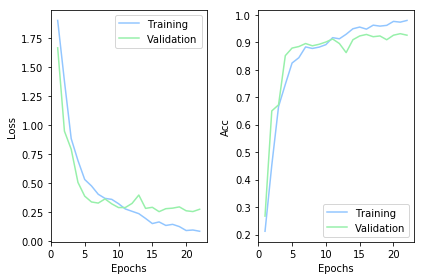

454/454 [==============================] - 0s 306us/step
Post-training accuracy: 88.546 %
Post-training loss: 0.4127
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing 

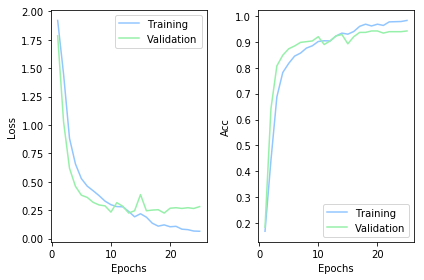

454/454 [==============================] - 0s 311us/step
Post-training accuracy: 86.784 %
Post-training loss: 0.4766
Start in layer: conv5_2_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss 

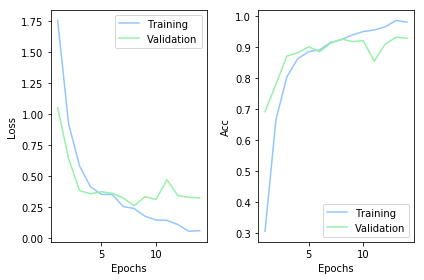

454/454 [==============================] - 0s 319us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3701
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


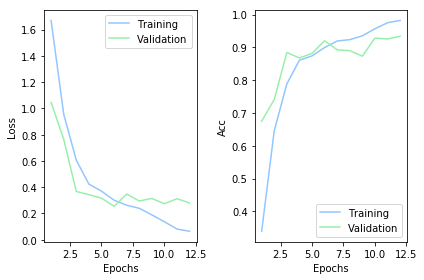

454/454 [==============================] - 0s 317us/step
Post-training accuracy: 86.784 %
Post-training loss: 0.3814
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

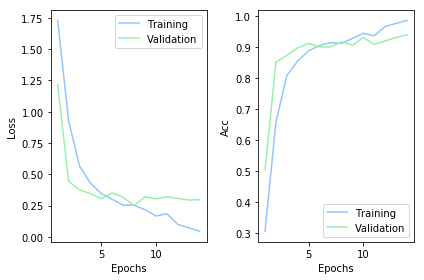

454/454 [==============================] - 0s 319us/step
Post-training accuracy: 85.903 %
Post-training loss: 0.4852
Start in layer: activation_72
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau

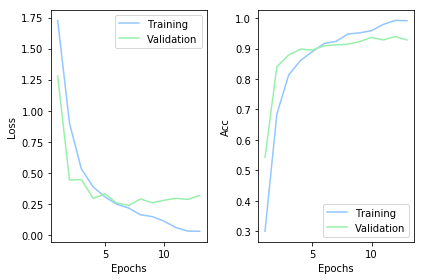

454/454 [==============================] - 0s 304us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3359
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

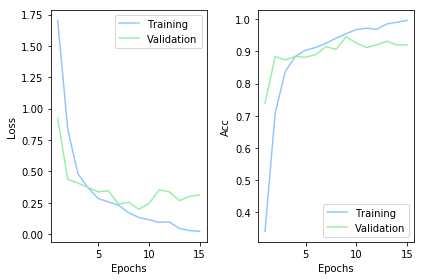

454/454 [==============================] - 0s 302us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.4182
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00

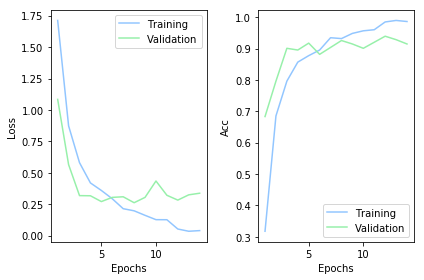

454/454 [==============================] - 0s 403us/step
Post-training accuracy: 88.106 %
Post-training loss: 0.4038
Start in layer: conv5_2_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.00050

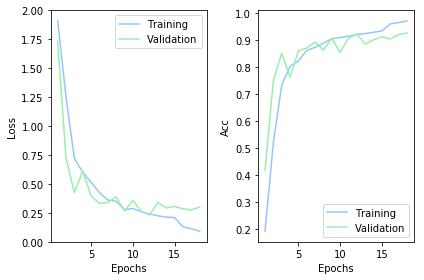

454/454 [==============================] - 0s 319us/step
Post-training accuracy: 86.564 %
Post-training loss: 0.4134
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

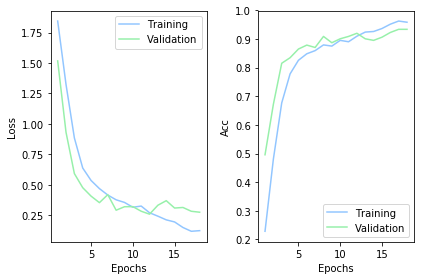

454/454 [==============================] - 0s 297us/step
Post-training accuracy: 87.665 %
Post-training loss: 0.4199
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

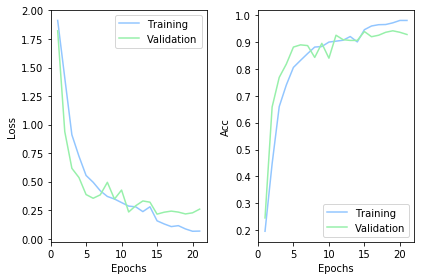

454/454 [==============================] - 0s 308us/step
Post-training accuracy: 88.767 %
Post-training loss: 0.359
Start in layer: conv5_2_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

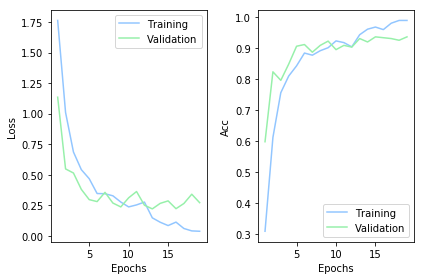

454/454 [==============================] - 0s 293us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.424
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.00025

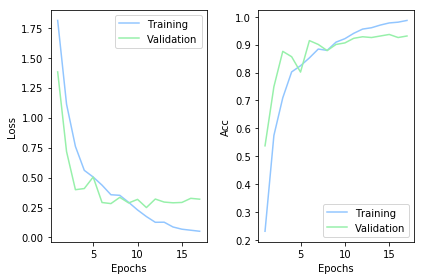

454/454 [==============================] - 0s 302us/step
Post-training accuracy: 86.784 %
Post-training loss: 0.4117
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

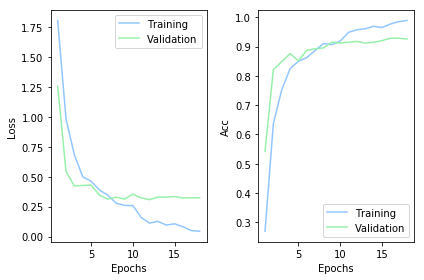

454/454 [==============================] - 0s 300us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.4281
Start in layer: activation_73
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00011: early stopping


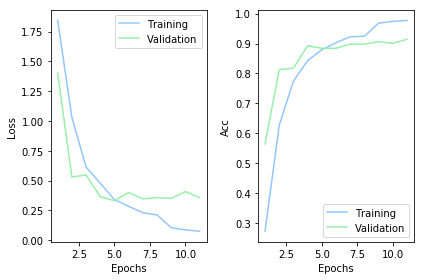

454/454 [==============================] - 0s 305us/step
Post-training accuracy: 83.48 %
Post-training loss: 0.4527
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 000

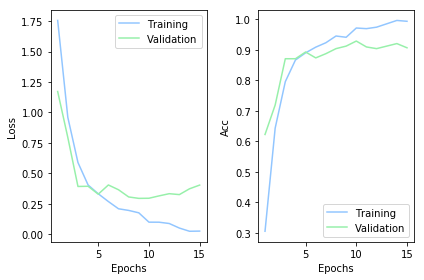

454/454 [==============================] - 0s 308us/step
Post-training accuracy: 88.987 %
Post-training loss: 0.3567
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 00012: early stopping


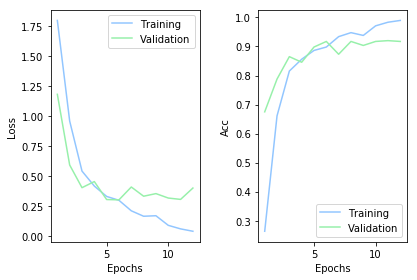

454/454 [==============================] - 0s 300us/step
Post-training accuracy: 87.225 %
Post-training loss: 0.3967
Start in layer: conv5_2_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate t

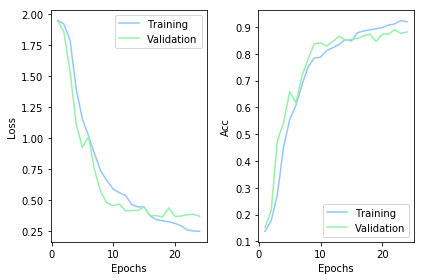

454/454 [==============================] - 0s 516us/step
Post-training accuracy: 84.141 %
Post-training loss: 0.478
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00016: ReduceLROnPlateau reducing l

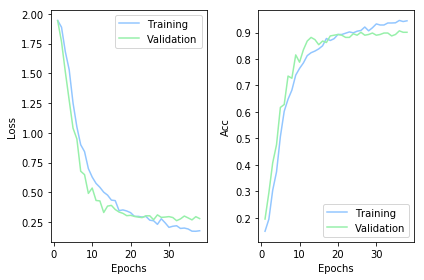

454/454 [==============================] - 0s 579us/step
Post-training accuracy: 85.903 %
Post-training loss: 0.4482
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve fr

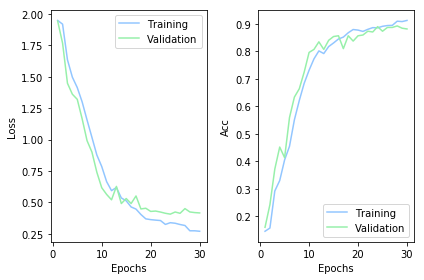

454/454 [==============================] - 0s 456us/step
Post-training accuracy: 84.802 %
Post-training loss: 0.5151
Start in layer: conv5_2_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130



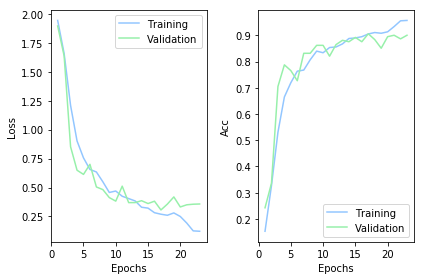

454/454 [==============================] - 0s 467us/step
Post-training accuracy: 85.022 %
Post-training loss: 0.4902
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

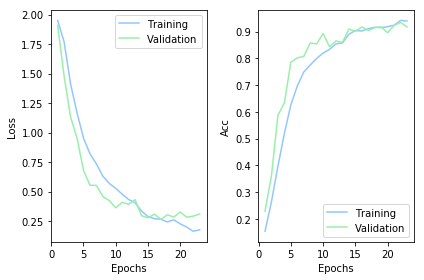

454/454 [==============================] - 0s 588us/step
Post-training accuracy: 82.819 %
Post-training loss: 0.4711
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

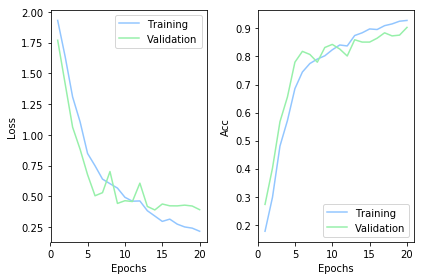

454/454 [==============================] - 0s 469us/step
Post-training accuracy: 82.819 %
Post-training loss: 0.5075
Start in layer: multiply_15
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not impro

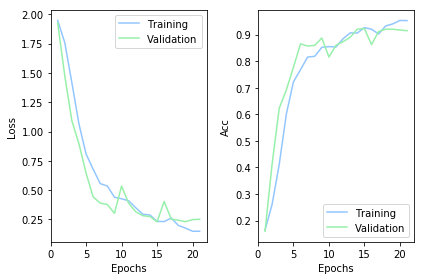

454/454 [==============================] - 0s 491us/step
Post-training accuracy: 85.683 %
Post-training loss: 0.4273
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve fr

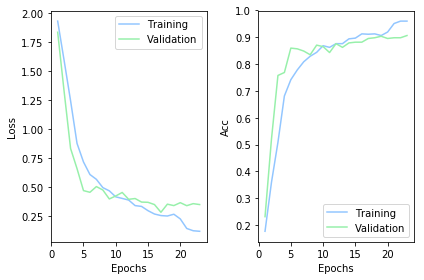

454/454 [==============================] - 0s 480us/step
Post-training accuracy: 84.141 %
Post-training loss: 0.5019
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00016

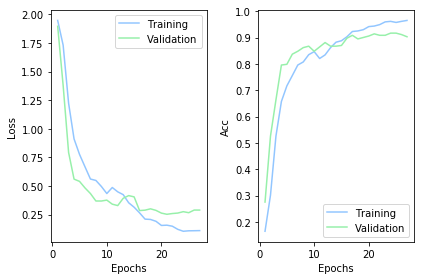

454/454 [==============================] - 0s 463us/step
Post-training accuracy: 84.581 %
Post-training loss: 0.5434
Start in layer: add_15
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing 

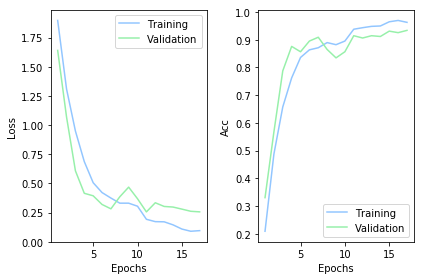

454/454 [==============================] - 0s 487us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3826
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

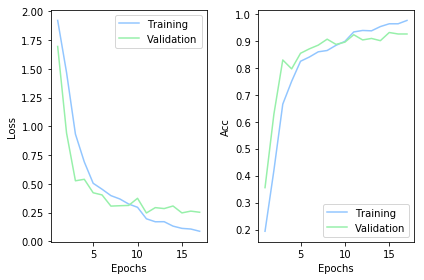

454/454 [==============================] - 0s 478us/step
Post-training accuracy: 87.885 %
Post-training loss: 0.3833
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130

Epoch 00017: val_loss did not improve fr

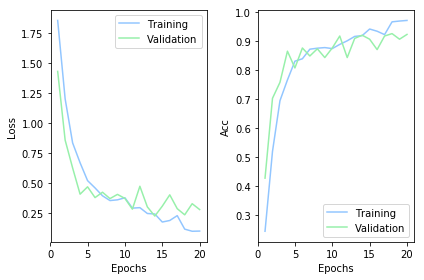

454/454 [==============================] - 0s 498us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.4186
Start in layer: activation_76
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

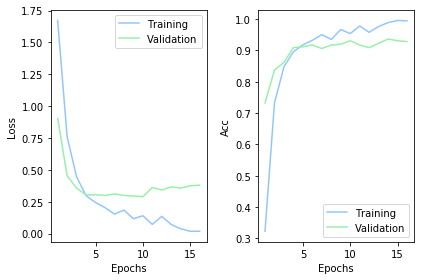

454/454 [==============================] - 0s 489us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.4626
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

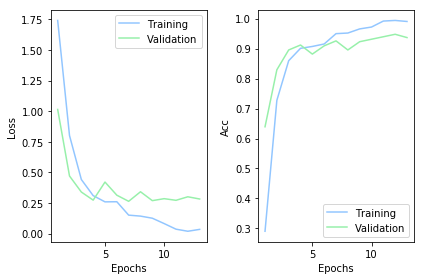

454/454 [==============================] - 0s 482us/step
Post-training accuracy: 89.427 %
Post-training loss: 0.3885
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0

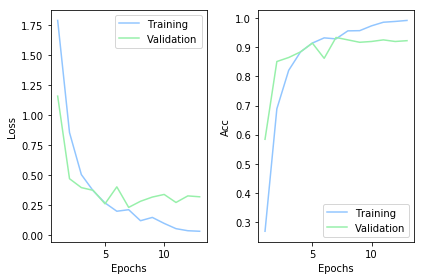

454/454 [==============================] - 0s 467us/step
Post-training accuracy: 88.326 %
Post-training loss: 0.3657
Start in layer: conv5_3_1x1_reduce
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did no

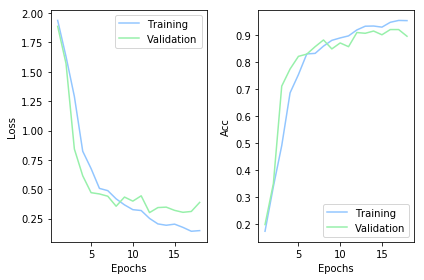

454/454 [==============================] - 0s 326us/step
Post-training accuracy: 85.463 %
Post-training loss: 0.492
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016:

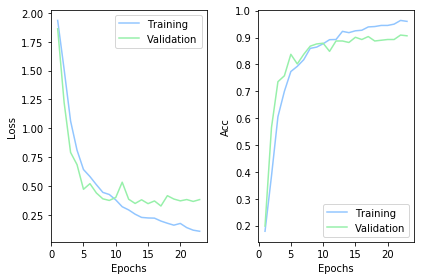

454/454 [==============================] - 0s 383us/step
Post-training accuracy: 85.683 %
Post-training loss: 0.4548
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

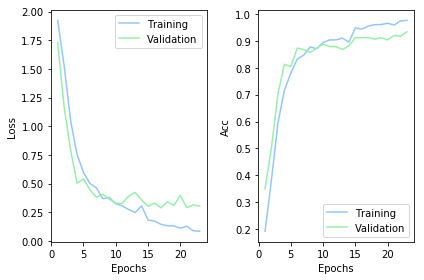

454/454 [==============================] - 0s 328us/step
Post-training accuracy: 86.784 %
Post-training loss: 0.5258
Start in layer: conv5_3_1x1_reduce/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did

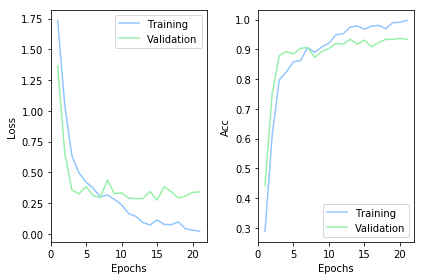

454/454 [==============================] - 0s 326us/step
Post-training accuracy: 87.445 %
Post-training loss: 0.4585
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

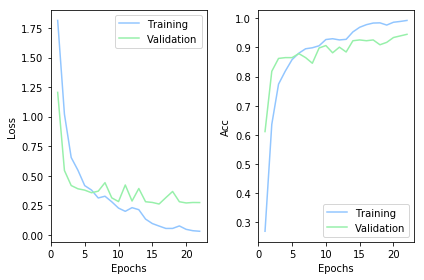

454/454 [==============================] - 0s 330us/step
Post-training accuracy: 87.225 %
Post-training loss: 0.5282
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

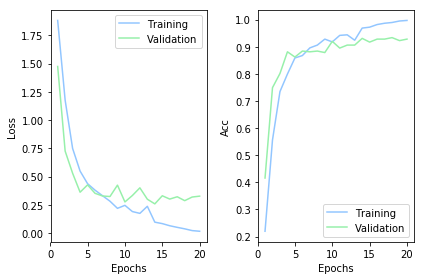

454/454 [==============================] - 0s 326us/step
Post-training accuracy: 87.225 %
Post-training loss: 0.5316
Start in layer: activation_77
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

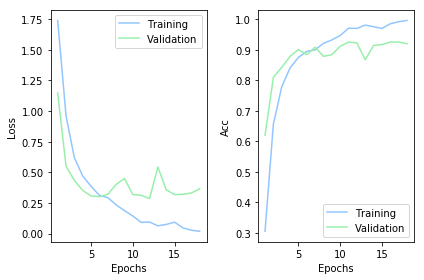

454/454 [==============================] - 0s 339us/step
Post-training accuracy: 87.665 %
Post-training loss: 0.485
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015:

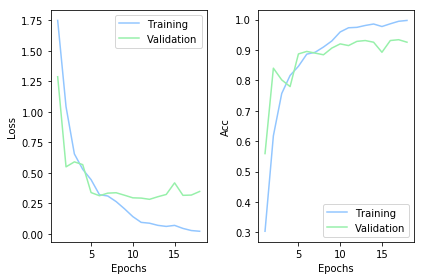

454/454 [==============================] - 0s 322us/step
Post-training accuracy: 87.004 %
Post-training loss: 0.5133
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mo

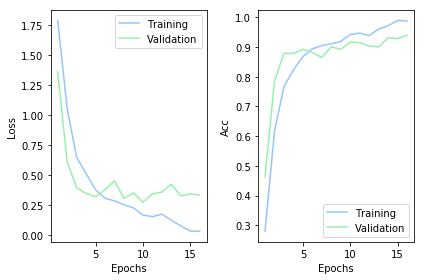

454/454 [==============================] - 0s 355us/step
Post-training accuracy: 85.903 %
Post-training loss: 0.3936
Start in layer: conv5_3_3x3
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau redu

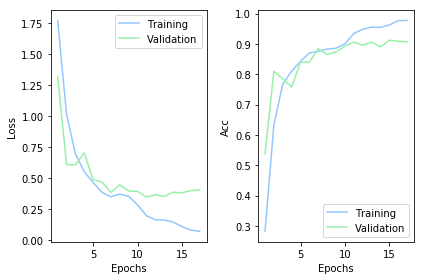

454/454 [==============================] - 0s 341us/step
Post-training accuracy: 85.463 %
Post-training loss: 0.5327
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

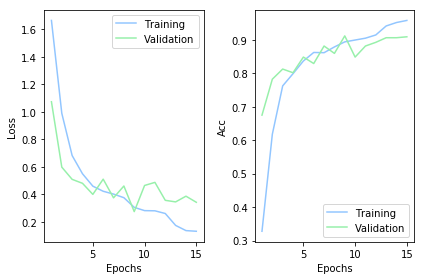

454/454 [==============================] - 0s 339us/step
Post-training accuracy: 82.599 %
Post-training loss: 0.6459
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00007: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00014: ReduceLROnPlateau reducing learning rate to 0.0002

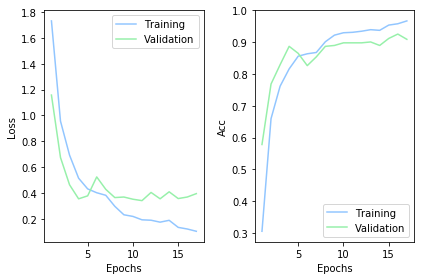

454/454 [==============================] - 0s 341us/step
Post-training accuracy: 83.26 %
Post-training loss: 0.5725
Start in layer: conv5_3_3x3/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not imp

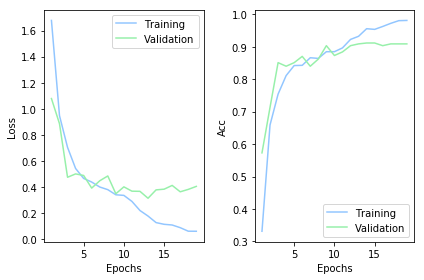

454/454 [==============================] - 0s 392us/step
Post-training accuracy: 83.48 %
Post-training loss: 0.5853
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130
Restoring mod

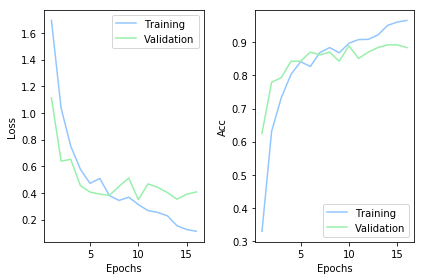

454/454 [==============================] - 0s 386us/step
Post-training accuracy: 82.379 %
Post-training loss: 0.5427
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the en

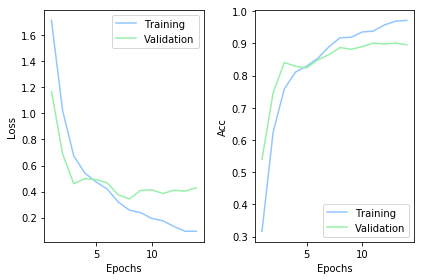

454/454 [==============================] - 0s 390us/step
Post-training accuracy: 83.7 %
Post-training loss: 0.5324
Start in layer: activation_78
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau r

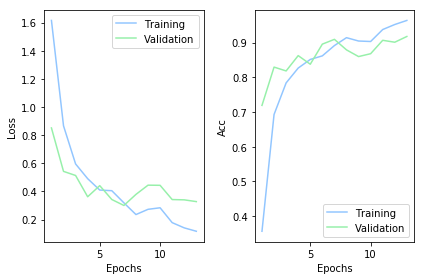

454/454 [==============================] - 0s 335us/step
Post-training accuracy: 83.04 %
Post-training loss: 0.5163
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130
Restoring model weights from the end

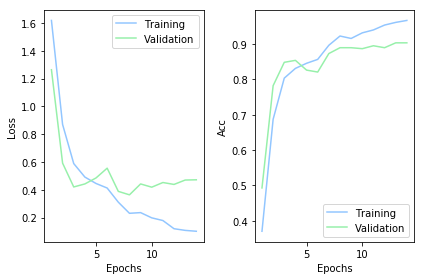

454/454 [==============================] - 0s 341us/step
Post-training accuracy: 79.956 %
Post-training loss: 0.6762
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00012: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00

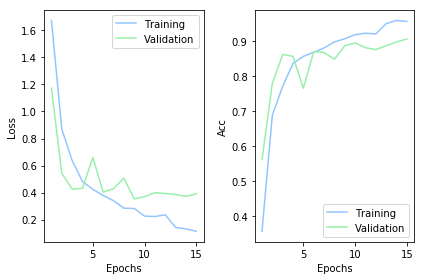

454/454 [==============================] - 0s 346us/step
Post-training accuracy: 84.141 %
Post-training loss: 0.5674
Start in layer: conv5_3_1x1_increase
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00010: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130
Restoring model weights from the end of the best epoch

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROn

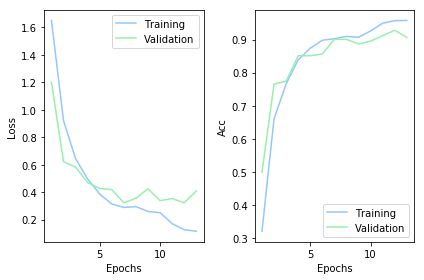

454/454 [==============================] - 0s 582us/step
Post-training accuracy: 81.718 %
Post-training loss: 0.5936
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00011: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00015

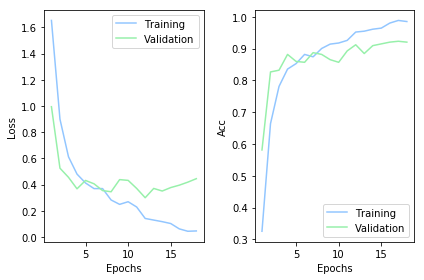

454/454 [==============================] - 0s 582us/step
Post-training accuracy: 83.921 %
Post-training loss: 0.578
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impro

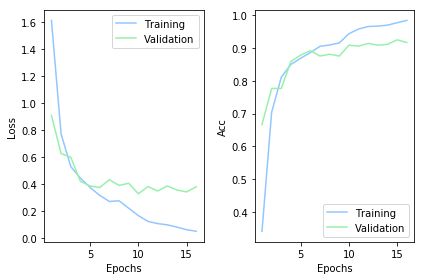

454/454 [==============================] - 0s 637us/step
Post-training accuracy: 83.921 %
Post-training loss: 0.5769
Start in layer: conv5_3_1x1_increase/bn
Start 1/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016: val_loss did not improve from 0.16130



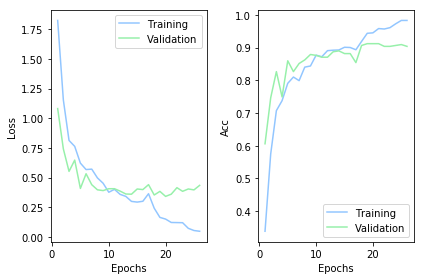

454/454 [==============================] - 0s 551us/step
Post-training accuracy: 83.921 %
Post-training loss: 0.6169
Start 2/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00014: val_loss did not improve from 0.16130

Epoch 00015: val_loss did not improve from 0.16130

Epoch 00016

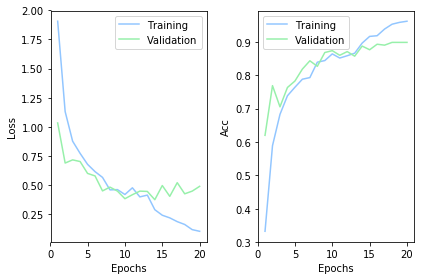

454/454 [==============================] - 0s 619us/step
Post-training accuracy: 81.718 %
Post-training loss: 0.6458
Start 3/3

Epoch 00001: val_loss did not improve from 0.16130

Epoch 00002: val_loss did not improve from 0.16130

Epoch 00003: val_loss did not improve from 0.16130

Epoch 00004: val_loss did not improve from 0.16130

Epoch 00005: val_loss did not improve from 0.16130

Epoch 00006: val_loss did not improve from 0.16130

Epoch 00007: val_loss did not improve from 0.16130

Epoch 00008: val_loss did not improve from 0.16130

Epoch 00009: val_loss did not improve from 0.16130

Epoch 00009: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00010: val_loss did not improve from 0.16130

Epoch 00011: val_loss did not improve from 0.16130

Epoch 00012: val_loss did not improve from 0.16130

Epoch 00013: val_loss did not improve from 0.16130

Epoch 00013: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 00014: val_loss did not impr

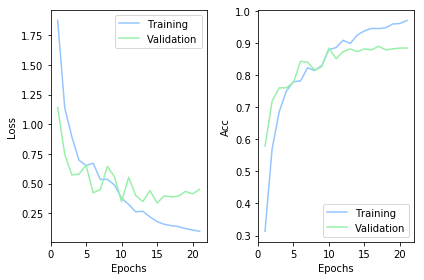

454/454 [==============================] - 0s 525us/step
Post-training accuracy: 81.938 %
Post-training loss: 0.7117


In [ ]:
batch_size = 16
num_epoch = 100

# callbacks
filepath = "C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn.best.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1,restore_best_weights=True) 
reduce_lr= ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=1e-5)

acc_scores= []
loss_scores = []
namelayer = []
fold = 3

start_layer = 'conv3_4_1x1_reduce'
end_layer = 'conv5_3_1x1_increase/bn' 
flag = 1

#base_model = VGGFace(include_top = False, input_shape = (224, 224, 3), model='senet50')
for layer in base_model.layers:
    if len(layer.output_shape[1:]) == 3 and layer.output_shape[1]>1:
        if layer.name == start_layer or flag == 0:
      
            acc_scores_tmp = []
            loss_scores_tmp = []

            layer_cut = layer.name
            model = Model(inputs=base_model.input, outputs=base_model.get_layer(layer_cut).output)
            x_train_fe = model.predict(x_train)
            x_val_fe = model.predict(x_val)
            x_test_fe = model.predict(x_test)
            print('Start in layer: {}'.format(layer_cut))
            for i in range(fold):
                print('Start {}/{}'.format(i+1, fold))
                # Create model
                model = Sequential()
                # C1
                model.add(Conv2D(32, kernel_size=1, activation='relu', input_shape= x_train_fe.shape[1:]))
                model.add(Conv2D(64, kernel_size=3, activation='relu'))
                model.add(Conv2D(64, kernel_size=1, activation='relu'))
                model.add(MaxPooling2D(pool_size=(2, 2)))
                model.add(Flatten())
                # D
                model.add(Dense(128, activation='relu')) 
                model.add(Dropout(0.5)) 
                model.add(Dense(64, activation='relu')) 
                model.add(Dense(7, activation='softmax'))
                # Compile model
                model.compile(loss=keras.losses.categorical_crossentropy,
                    optimizer=keras.optimizers.Adam(),
                    metrics=['acc'])
        
                # Fit the model
                model_log = model.fit(x_train_fe, y_train,
                batch_size=batch_size,
                epochs=num_epoch,
                verbose=0,
                validation_data=(x_val_fe, y_val),
                callbacks=[early_stopping, checkpoint, reduce_lr])

                # visualize graph
                graph(model_log)

                # Evaluate the model
                # model.load_weights(filepath)
                scores = model.evaluate(x_test_fe, y_test, verbose=1)
                accuracy = 100*scores[1]
                loss = scores[0]
                print("Post-training accuracy: {} %".format(round(accuracy, 3)))
                print("Post-training loss: {}".format(round(loss, 4)))
                acc_scores_tmp.append(accuracy)
                loss_scores_tmp.append(loss)
                flag = 0

            acc_scores.append(np.mean(acc_scores_tmp))
            loss_scores.append(np.mean(loss_scores_tmp))
            namelayer.append(layer.name)

            if layer.name == end_layer:
                break

We visualize layer that has reached the maximum value of accuracy in cross-validation.

In [ ]:
namelayer[acc_scores.index(max(acc_scores))], max(acc_scores), len(acc_scores)

('add_12', 91.40969163870847, 111)

We save all scores of all layers selecting:

In [ ]:
dataset_layers=pd.DataFrame({'layer':namelayer, 'acc_mean':acc_scores})
dataset_layers.head()

,layer,acc_mean
0,conv3_4_1x1_reduce,90.014684
1,conv3_4_1x1_reduce/bn,88.839941
2,activation_32,88.252570
3,conv3_4_3x3,89.720999
4,conv3_4_3x3/bn,89.280470


We plot score of all layers test.

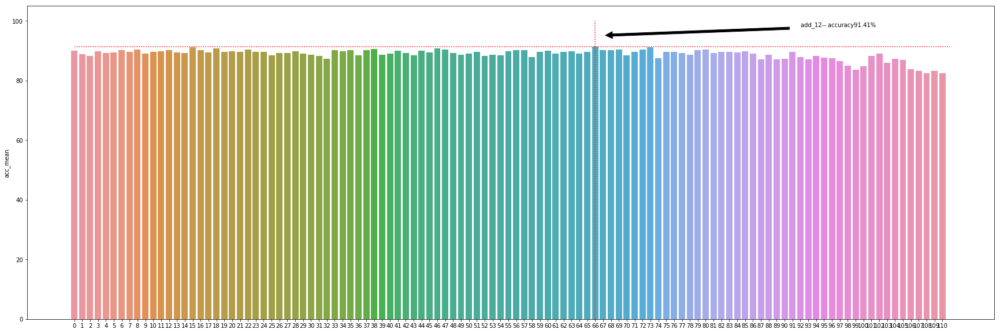

In [ ]:
plt.figure(figsize=(30,10))
sns.barplot(x=dataset_layers['layer'].index, y=dataset_layers['acc_mean'])
plt.hlines(max(dataset_layers['acc_mean']), 0, len(dataset_layers['acc_mean']), linestyles=':', colors='red')
textAnn=dataset_layers['layer'][dataset_layers['acc_mean'].idxmax()]+'-- accuracy'+str(round(max(dataset_layers['acc_mean']),2))+'%'
plt.annotate(textAnn, xy=(66, 95), xycoords='data', xytext=(0.8, 0.95), textcoords='axes fraction', arrowprops=dict(facecolor='black', shrink=0.05), horizontalalignment='left', verticalalignment='top')
plt.vlines(dataset_layers['acc_mean'].idxmax(), 0, 100, linestyles=':', colors='r')

**Best Model**

We summarized the best model (with feature extraction and optimal cut) in the follow line and save it to test in follow notebook on new images:


Epoch 00001: val_loss improved from inf to 0.94309, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn_best.h5

Epoch 00002: val_loss improved from 0.94309 to 0.46096, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn_best.h5

Epoch 00003: val_loss improved from 0.46096 to 0.26844, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn_best.h5

Epoch 00004: val_loss did not improve from 0.26844

Epoch 00005: val_loss did not improve from 0.26844

Epoch 00006: val_loss did not improve from 0.26844

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 00007: val_loss improved from 0.26844 to 0.19603, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn_best.h5

Epoch 00008: val_loss did not improve from 0.19603

Epoch 00009: val_loss improved from 0.19603 to 0.19500, saving model to C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn_best.h5

Epoch 00010: val_loss did not improve from 0.19500

Ep

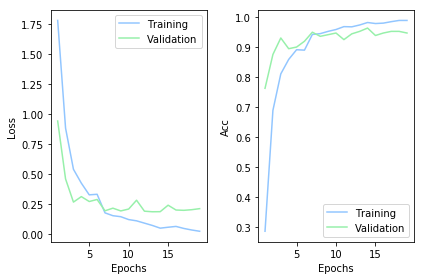

acc: 91.19%


In [ ]:
#callbacks
filepath = "C:/Users/valen/Desktop/magistrale/DSIM/aml_cnn/cnn_best.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=6, verbose=1,restore_best_weights=True) 
reduce_lr= ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=1e-5)


model = Model(inputs=base_model.input, outputs=base_model.get_layer('add_12').output)
x_train_fe = model.predict(x_train)
x_val_fe = model.predict(x_val)
x_test_fe = model.predict(x_test)
# Create model
model = Sequential()
# C1
model.add(Conv2D(32, kernel_size=1, activation='relu', input_shape= x_train_fe.shape[1:]))
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(Conv2D(64, kernel_size=1, activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
# D
model.add(Dense(128, activation='relu')) 
model.add(Dropout(0.5)) 
model.add(Dense(64, activation='relu')) 
model.add(Dense(7, activation='softmax'))
# Compile model
model.compile(loss=keras.losses.categorical_crossentropy,
                optimizer=keras.optimizers.Adam(),
                metrics=['accuracy'])
# Fit the model
model_log = model.fit(x_train_fe, y_train, batch_size=16,
                epochs=num_epoch,
                verbose=0,
                validation_data=(x_val_fe, y_val),
                callbacks=[early_stopping, checkpoint, reduce_lr])
graph(model_log)
# Evaluate the model
scores = model.evaluate(x_test_fe, y_test, verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

We also define classification report and confusion matrix to view performance for all classes.

Classification report:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89        64
           1       0.90      0.88      0.89        60
           2       0.93      0.89      0.91        63
           3       0.97      0.98      0.98        64
           4       0.89      0.93      0.91        69
           5       0.94      0.85      0.89        73
           6       0.89      0.95      0.92        61

    accuracy                           0.91       454
   macro avg       0.91      0.91      0.91       454
weighted avg       0.91      0.91      0.91       454

Confusion matrix:
[[58  3  0  1  0  2  0]
 [ 7 53  0  0  0  0  0]
 [ 0  1 56  0  1  0  5]
 [ 0  1  0 63  0  0  0]
 [ 0  0  1  1 64  2  1]
 [ 2  1  3  0  4 62  1]
 [ 0  0  0  0  3  0 58]]


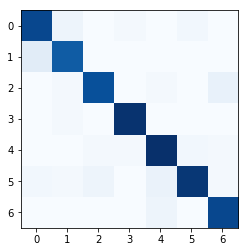

In [ ]:
y_pred=model.predict(x_test_fe)
y_pred= np.argmax(y_pred, axis=1)

print('Classification report:')
print(classification_report(y_eff, y_pred))

print('Confusion matrix:')
cm=confusion_matrix(y_eff, y_pred)
print(cm)
plt.imshow(cm, cmap=plt.cm.Blues)

Result are more similar to the last neural network with fine tuning, but we note that the score for each classes are more balanced. In some classes fine tuning techniques are better than cnn, but in other classes cnn wrong less. All two information are important. In fact, we decide to use ensemble model that include the two model. This operation is included in the following notebook *Final_model_6.ipynb*.